<h2>Project Progress Report: Group 6
    <p></p>
<p>    SUPERSTORE DATA - ANOMALY DETECTION, RECOMMENDATION ENGINE AND FORCAST ANALYSIS</p>

<b>Introduction:</b>

Anomaly detection is a process of identifying or highlighting the rare items, outliers, observations which are significantly different from majority of the data. We picked superstore sales data to find patterns in different segments such as Sales, Profit, Discount which are different or show unexpected behaviour. Even though the data is used commonly for various types of analysis, this exercise is providing us a good learning opportunity and exposure for unsupervised machine learning techniques. 


<b>Data Used:

Sample – Superstore sales: </b>

<p>•	The excel sheet consists of Sales and Profit data for three categories – Furniture, Office supplies and Technology. 
<p>•	The sales data belongs to different states in the United States
<p>•	Details of orders, customers and product names are mentioned
<p>•	Consists of overall 9994 products 
<p>•	Downloaded from Tableau community as this dataset is famously used for data visualization
<p>•	Source: <a>https://community.tableau.com/s/question/0D54T00000CWeX8SAL/sample-superstore-sales-excelxls</a>


The dataset which we are using are Retail store data with below features
       - RowID
       - OrderID
       - OrderDate
       - ShipDate
       - ShipMode
       - CustomerID
       - Customer Name
       - Segment
       - Country
       - City
       - State
       - Postal Code
       - Region 
       - Product ID
       - Category
       - Sub Category
       - Product Names
       - Sales
       - Quantity
       - Discount
       - Profit 

<b>Goals and Objectives: </b>

<p><b>Task 1:</b>	Perform an Exploratory data analysis(EDA) on the data and identify the most important features
<p><b>Task 2:</b>	Develop a recommendation engine for user and state to obtain high profits and Sales
<p><b>Task 3:</b>	Perform Anomaly detection on any of the single feature (profit/sales) to identify outliers 
<p><b>Task 4:</b>	Predicting the future sales based on Forcasting Analysis


In [1]:
# Basic packages used
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\SAI\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


<h3><b>Task 1:</b>	Perform an Exploratory data analysis on the data and identify the most important features

In [2]:
# The Data set which we are using is of a Retail Store transaction data
df = pd.read_excel('Superstore.xls')
data = df.copy()
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [3]:
#Checking each feature
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   datetime64[ns]
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [4]:
# Findingout if there are any missing values in the dataset
df.isnull().any()

Row ID           False
Order ID         False
Order Date       False
Ship Date        False
Ship Mode        False
Customer ID      False
Customer Name    False
Segment          False
Country          False
City             False
State            False
Postal Code      False
Region           False
Product ID       False
Category         False
Sub-Category     False
Product Name     False
Sales            False
Quantity         False
Discount         False
Profit           False
dtype: bool

In [5]:
# Visualizing the statistics of numeric values in dataset by using describe.
df.describe()

,Row ID,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,4997.500000,55190.379428,229.858001,3.789574,0.156203,28.656896
std,2885.163629,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1.000000,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2499.250000,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,4997.500000,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,7495.750000,90008.000000,209.940000,5.000000,0.200000,29.364000
max,9994.000000,99301.000000,22638.480000,14.000000,0.800000,8399.976000


In [6]:
#The Attributes or the features given for each labels are given below
print("The Columns of the data are {}".format(data.columns.tolist()))

The Columns of the data are ['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State', 'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit']


<h1>Product Details</h1>

In [7]:
# Product List per category
List_of_categories = data.Category.unique()
print(List_of_categories)

['Furniture' 'Office Supplies' 'Technology']


In [8]:
# Product List per Sub category
List_of_sub_categories = data['Sub-Category'].unique()
print(List_of_sub_categories)

['Bookcases' 'Chairs' 'Labels' 'Tables' 'Storage' 'Furnishings' 'Art'
 'Phones' 'Binders' 'Appliances' 'Paper' 'Accessories' 'Envelopes'
 'Fasteners' 'Supplies' 'Machines' 'Copiers']


In [9]:
# Product List
List_of_all_products = data['Product Name'].unique()
print(len(List_of_all_products))

1850


In [10]:
# Total Products in Furniture
furniture_products = data.loc[data['Category'] == List_of_categories[0]]['Product Name'].unique()
print("Total Number of Furniture Products are {}".format(len(furniture_products)))
print("Furniture Products are \n{}".format(furniture_products))

Total Number of Furniture Products are 380
Furniture Products are 
['Bush Somerset Collection Bookcase'
 'Hon Deluxe Fabric Upholstered Stacking Chairs, Rounded Back'
 'Bretford CR4500 Series Slim Rectangular Table'
 'Eldon Expressions Wood and Plastic Desk Accessories, Cherry Wood'
 'Chromcraft Rectangular Conference Tables'
 'Global Deluxe Stacking Chair, Gray'
 'Riverside Palais Royal Lawyers Bookcase, Royale Cherry Finish'
 'Howard Miller 13-3/4" Diameter Brushed Chrome Round Wall Clock'
 "Electrix Architect's Clamp-On Swing Arm Lamp, Black"
 'Atlantic Metals Mobile 3-Shelf Bookcases, Custom Colors'
 "Global Fabric Manager's Chair, Dark Gray" 'Longer-Life Soft White Bulbs'
 'Global Leather Task Chair, Black' 'Novimex Turbo Task Chair'
 'Luxo Economy Swing Arm Lamp'
 "Global Value Mid-Back Manager's Chair, Gray"
 "High-Back Leather Manager's Chair"
 'Tenex Traditional Chairmats for Medium Pile Carpet, Standard Lip, 36" x 48"'
 '6" Cubicle Wall Clock, Black'
 'Eldon Expressions Desk 

In [11]:
### Total Products in Office Supplies
Office_Supplies = data.loc[data['Category'] == List_of_categories[1]]['Product Name'].unique()
print("Total Number of Office Supplies Products are {}".format(len(Office_Supplies)))
print("Office Supplies Products are \n{}".format(Office_Supplies))

Total Number of Office Supplies Products are 1058
Office Supplies Products are 
['Self-Adhesive Address Labels for Typewriters by Universal'
 "Eldon Fold 'N Roll Cart System" 'Newell 322' ... 'Grip Seal Envelopes'
 'Eureka Hand Vacuum, Bagless'
 'Eldon Jumbo ProFile Portable File Boxes Graphite/Black']


In [12]:
# Total Products in Technology
Technology_products = data.loc[data['Category'] == List_of_categories[2]]['Product Name'].unique()
print("Total Number of Technology Products are {}".format(len(Technology_products)))
print("Technology Products are \n{}".format(Technology_products))

Total Number of Technology Products are 412
Technology Products are 
['Mitel 5320 IP Phone VoIP phone'
 'Konftel 250 Conference\xa0phone\xa0- Charcoal black'
 'Cisco SPA 501G IP Phone'
 'Imation\xa08GB Mini TravelDrive USB 2.0\xa0Flash Drive' 'GE 30524EE4'
 'Plantronics HL10 Handset Lifter' 'Panasonic Kx-TS550'
 'Verbatim 25 GB 6x Blu-ray Single Layer Recordable Disc, 25/Pack'
 'Imation\xa08gb Micro Traveldrive Usb 2.0\xa0Flash Drive'
 'LF Elite 3D Dazzle Designer Hard Case Cover, Lf Stylus Pen and Wiper For Apple Iphone 5c Mini Lite'
 'AT&T CL83451 4-Handset Telephone'
 'Verbatim 25 GB 6x Blu-ray Single Layer Recordable Disc, 3/Pack'
 'netTALK DUO VoIP Telephone Service'
 'Logitech\xa0LS21 Speaker System - PC Multimedia - 2.1-CH - Wired'
 'SanDisk Ultra 64 GB MicroSDHC Class 10 Memory Card'
 'Logitech K350 2.4Ghz Wireless Keyboard'
 'Memorex Mini Travel Drive 8 GB USB 2.0 Flash Drive'
 'Speck Products Candyshell Flip Case'
 'Logitech\xa0Gaming G510s - Keyboard'
 'KLD Oscar II Style Sn

 'RCA ViSYS 25425RE1 Corded phone' 'Cisco 8961 IP Phone Charcoal' 'LG G2']


2. Top Average of Sales, Profits per Category, Sub Category and Product 

In [13]:
# Top Profit and Sales gained on categories are
category_profit = data.groupby('Category').Profit.mean().sort_values(ascending=False).head()
category_Sales = data.groupby('Category').Sales.mean().sort_values(ascending=False).head()

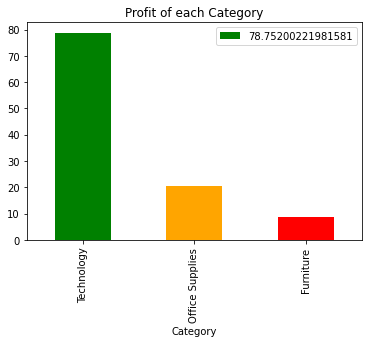

In [14]:
# Top Profit of each Category
category_profit.plot.bar(x=category_profit.index, y=category_profit, color = ['green','orange','red'],title = 'Profit of each Category').legend(labels=category_profit.tolist())

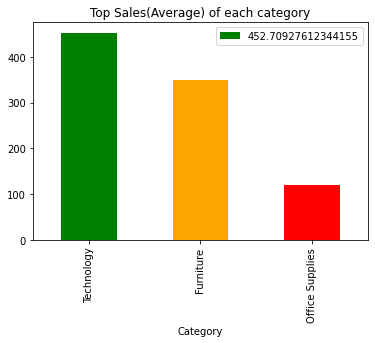

In [15]:
# Top Sales(Average)
category_Sales.plot.bar(x=category_Sales.index, y=category_Sales, color = ['green','orange','red'],title = 'Top Sales(Average) of each category').legend(labels=category_Sales.tolist())

In [16]:
# Top Profit and sales gained on sub categories are
sub_category_profit = data.groupby('Sub-Category').Profit.mean().sort_values(ascending=False).head()
sub_category_sales = data.groupby('Sub-Category').Sales.mean().sort_values(ascending=False).head()

In [17]:
# Least Profit and sales gained on sub categories are
L_sub_category_profit = data.groupby('Sub-Category').Profit.mean().sort_values(ascending=True).head()
L_sub_category_sales = data.groupby('Sub-Category').Sales.mean().sort_values(ascending=True).head()

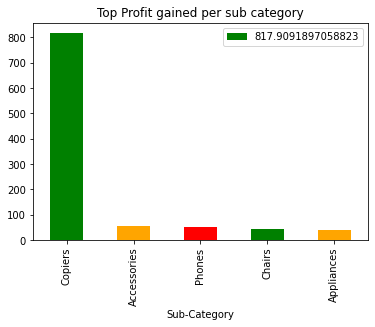

In [18]:
# Top profit gained on sub category
sub_category_profit.plot.bar(x=sub_category_profit.index, y=sub_category_profit, color = ['green','orange','red'], title='Top Profit gained per sub category').legend(labels=sub_category_profit.tolist())

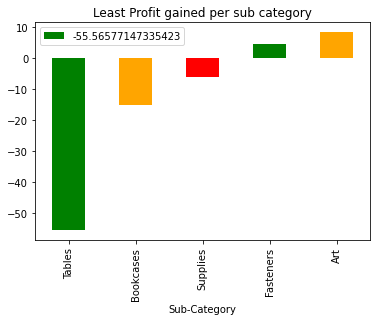

In [19]:
# Least profit gained on sub category
L_sub_category_profit.plot.bar(x=L_sub_category_profit.index, y=L_sub_category_profit, color = ['green','orange','red'], title='Least Profit gained per sub category').legend(labels=L_sub_category_profit.tolist())

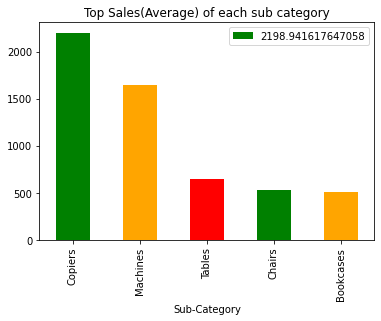

In [20]:
# Top Sales(Average)
sub_category_sales.plot.bar(x=sub_category_sales.index, y=sub_category_sales, color = ['green','orange','red'],title = 'Top Sales(Average) of each sub category').legend(labels=sub_category_sales.tolist())

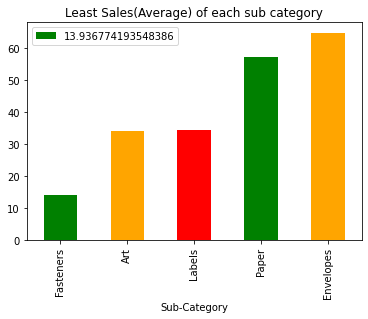

In [21]:
# Least Sales(Average)
L_sub_category_sales.plot.bar(x=L_sub_category_sales.index, y=L_sub_category_sales, color = ['green','orange','red'],title = 'Least Sales(Average) of each sub category').legend(labels=L_sub_category_sales.tolist())

In [22]:
# Top Profit and Sales gained on Products are
product_profit = data.groupby('Product Name').Profit.mean().sort_values(ascending=False).head()
product_sales = data.groupby('Product Name').Sales.mean().sort_values(ascending=False).head()

In [23]:
# Least Profit and Sales gained on Products are
L_product_profit = data.groupby('Product Name').Profit.mean().sort_values(ascending=True).head()
L_product_sales = data.groupby('Product Name').Sales.mean().sort_values(ascending=True).head()

In [24]:
# Top List of Products with high Profits
data.sort_values(by='Profit',ascending=False).head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
6826,6827,CA-2016-118689,2016-10-02,2016-10-09,Standard Class,TC-20980,Tamara Chand,Corporate,United States,Lafayette,...,47905,Central,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,17499.95,5,0.0,8399.9760
8153,8154,CA-2017-140151,2017-03-23,2017-03-25,First Class,RB-19360,Raymond Buch,Consumer,United States,Seattle,...,98115,West,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,13999.96,4,0.0,6719.9808
4190,4191,CA-2017-166709,2017-11-17,2017-11-22,Standard Class,HL-15040,Hunter Lopez,Consumer,United States,Newark,...,19711,East,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,10499.97,3,0.0,5039.9856
9039,9040,CA-2016-117121,2016-12-17,2016-12-21,Standard Class,AB-10105,Adrian Barton,Consumer,United States,Detroit,...,48205,Central,OFF-BI-10000545,Office Supplies,Binders,GBC Ibimaster 500 Manual ProClick Binding System,9892.74,13,0.0,4946.3700
4098,4099,CA-2014-116904,2014-09-23,2014-09-28,Standard Class,SC-20095,Sanjit Chand,Consumer,United States,Minneapolis,...,55407,Central,OFF-BI-10001120,Office Supplies,Binders,Ibico EPK-21 Electric Binding System,9449.95,5,0.0,4630.4755


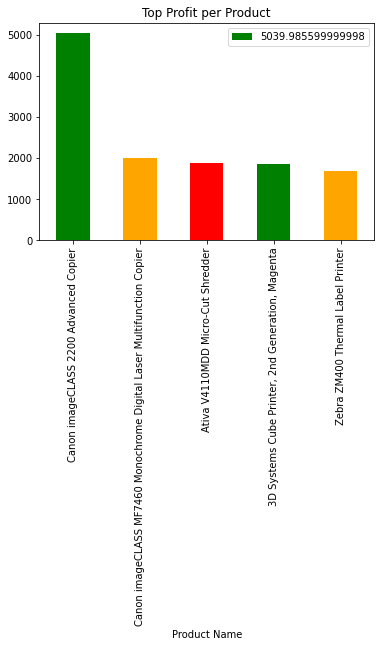

In [25]:
# Top Profit per Product
product_profit.plot.bar(x=product_profit.index, y=product_profit, color = ['green','orange','red'],title='Top Profit per Product').legend(labels=product_profit.tolist())

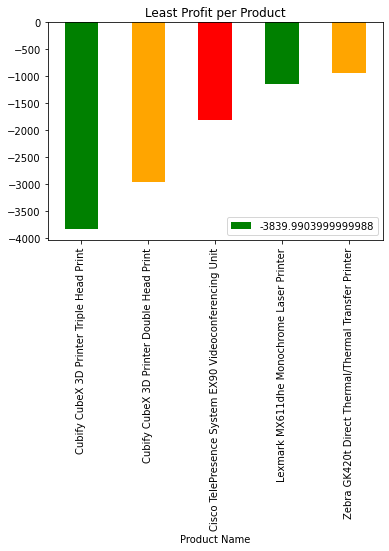

In [26]:
# Least Profit per Product
L_product_profit.plot.bar(x=L_product_profit.index, y=L_product_profit, color = ['green','orange','red'],title='Least Profit per Product').legend(labels=L_product_profit.tolist())

In [27]:
# Top List of Products with high Sales
data.sort_values(by='Sales',ascending=False).head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
2697,2698,CA-2014-145317,2014-03-18,2014-03-23,Standard Class,SM-20320,Sean Miller,Home Office,United States,Jacksonville,...,32216,South,TEC-MA-10002412,Technology,Machines,Cisco TelePresence System EX90 Videoconferenci...,22638.480,6,0.5,-1811.0784
6826,6827,CA-2016-118689,2016-10-02,2016-10-09,Standard Class,TC-20980,Tamara Chand,Corporate,United States,Lafayette,...,47905,Central,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,17499.950,5,0.0,8399.9760
8153,8154,CA-2017-140151,2017-03-23,2017-03-25,First Class,RB-19360,Raymond Buch,Consumer,United States,Seattle,...,98115,West,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,13999.960,4,0.0,6719.9808
2623,2624,CA-2017-127180,2017-10-22,2017-10-24,First Class,TA-21385,Tom Ashbrook,Home Office,United States,New York City,...,10024,East,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,11199.968,4,0.2,3919.9888
4190,4191,CA-2017-166709,2017-11-17,2017-11-22,Standard Class,HL-15040,Hunter Lopez,Consumer,United States,Newark,...,19711,East,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,10499.970,3,0.0,5039.9856


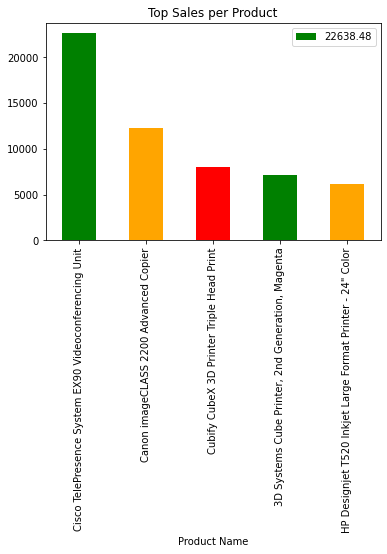

In [28]:
# Top Sales per Product
product_sales.plot.bar(x=product_sales.index, y=product_sales, color = ['green','orange','red'],title='Top Sales per Product').legend(labels=product_sales.tolist())

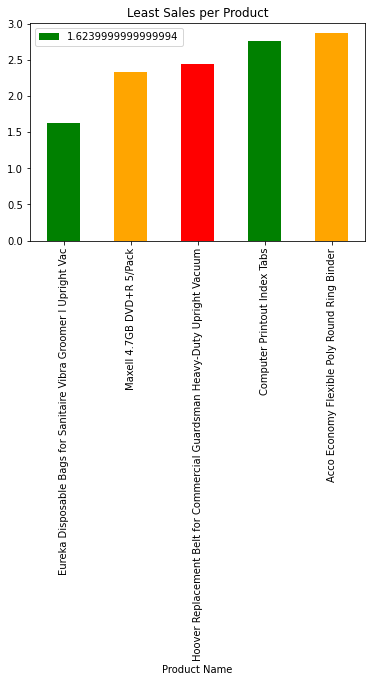

In [29]:
# Least Sales per Product
L_product_sales.plot.bar(x=L_product_sales.index, y=L_product_sales, color = ['green','orange','red'],title='Least Sales per Product').legend(labels=L_product_sales.tolist())

<h1>Per Customer Details</h1>

In [30]:
data['Number of Purchases'] = data.groupby('Customer Name')['Customer Name'].transform('count')

In [31]:
# Top Loyal Purchases per customer
data_top_Profit = data.sort_values(by=['Profit','Sales','Quantity','Number of Purchases'],ascending=False)
data_top_Profit.head(10)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Number of Purchases
6826,6827,CA-2016-118689,2016-10-02,2016-10-09,Standard Class,TC-20980,Tamara Chand,Corporate,United States,Lafayette,...,Central,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,17499.950,5,0.0,8399.9760,12
8153,8154,CA-2017-140151,2017-03-23,2017-03-25,First Class,RB-19360,Raymond Buch,Consumer,United States,Seattle,...,West,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,13999.960,4,0.0,6719.9808,18
4190,4191,CA-2017-166709,2017-11-17,2017-11-22,Standard Class,HL-15040,Hunter Lopez,Consumer,United States,Newark,...,East,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,10499.970,3,0.0,5039.9856,11
9039,9040,CA-2016-117121,2016-12-17,2016-12-21,Standard Class,AB-10105,Adrian Barton,Consumer,United States,Detroit,...,Central,OFF-BI-10000545,Office Supplies,Binders,GBC Ibimaster 500 Manual ProClick Binding System,9892.740,13,0.0,4946.3700,20
4098,4099,CA-2014-116904,2014-09-23,2014-09-28,Standard Class,SC-20095,Sanjit Chand,Consumer,United States,Minneapolis,...,Central,OFF-BI-10001120,Office Supplies,Binders,Ibico EPK-21 Electric Binding System,9449.950,5,0.0,4630.4755,22
2623,2624,CA-2017-127180,2017-10-22,2017-10-24,First Class,TA-21385,Tom Ashbrook,Home Office,United States,New York City,...,East,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,11199.968,4,0.2,3919.9888,10
509,510,CA-2015-145352,2015-03-16,2015-03-22,Standard Class,CM-12385,Christopher Martinez,Consumer,United States,Atlanta,...,South,OFF-BI-10003527,Office Supplies,Binders,Fellowes PB500 Electric Punch Plastic Comb Bin...,6354.950,5,0.0,3177.4750,10
8488,8489,CA-2016-158841,2016-02-02,2016-02-04,Second Class,SE-20110,Sanjit Engle,Consumer,United States,Arlington,...,South,TEC-MA-10001127,Technology,Machines,HP Designjet T520 Inkjet Large Format Printer ...,8749.950,5,0.0,2799.9840,19
7666,7667,US-2016-140158,2016-10-04,2016-10-08,Standard Class,DR-12940,Daniel Raglin,Home Office,United States,Providence,...,East,TEC-CO-10001449,Technology,Copiers,Hewlett Packard LaserJet 3310 Copier,5399.910,9,0.0,2591.9568,13
6520,6521,CA-2017-138289,2017-01-16,2017-01-18,Second Class,AR-10540,Andy Reiter,Consumer,United States,Jackson,...,Central,OFF-BI-10004995,Office Supplies,Binders,GBC DocuBind P400 Electric Binding System,5443.960,4,0.0,2504.2216,9


In [32]:
# Top Profit and Sales per customer
data_top_Profit_chart = data_top_Profit.groupby(['Customer Name']).Profit.mean().sort_values(ascending=False).head(10)
data_top_Sales_chart = data_top_Profit.groupby(['Customer Name']).Sales.mean().sort_values(ascending=False).head(10)
data_top_Profit_chart.head(10)

Customer Name
Tamara Chand            748.443658
Mitch Willingham        555.172000
Hunter Lopez            511.129927
Tom Ashbrook            470.378830
Christopher Martinez    389.989040
Raymond Buch            387.560883
Andy Reiter             320.513422
Bill Shonely            290.673822
Adrian Barton           272.240275
Sanjit Chand            261.700541
Name: Profit, dtype: float64

In [33]:
# Least Profit and Sales per customer
L_data_top_Profit_chart = data_top_Profit.groupby(['Customer Name']).Profit.mean().sort_values(ascending=True).head(10)
L_data_top_Sales_chart = data_top_Profit.groupby(['Customer Name']).Sales.mean().sort_values(ascending=True).head(10)

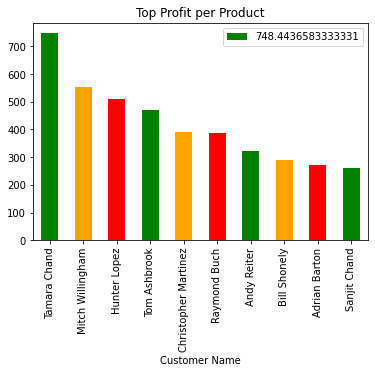

In [34]:
# Top Profits of 10 loyal Customer
data_top_Profit_chart.plot.bar(x=data_top_Profit_chart.index, y=data_top_Profit_chart, color = ['green','orange','red'],title='Top Profit per Product').legend(labels=data_top_Profit_chart.tolist())

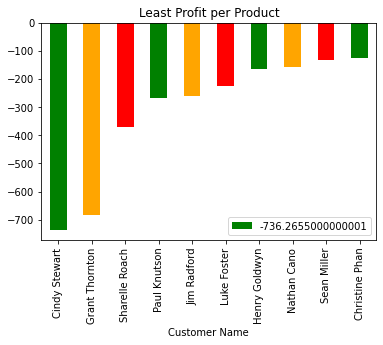

In [35]:
# Least Profits of Customer
L_data_top_Profit_chart.plot.bar(x=L_data_top_Profit_chart.index, y=L_data_top_Profit_chart, color = ['green','orange','red'],title='Least Profit per Product').legend(labels=L_data_top_Profit_chart.tolist())

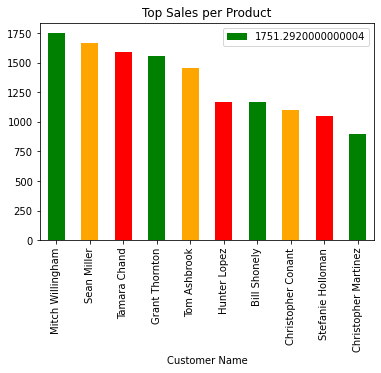

In [36]:
# Top Sales per Customer
data_top_Sales_chart.plot.bar(x=data_top_Sales_chart.index, y=data_top_Sales_chart, color = ['green','orange','red'],title='Top Sales per Product').legend(labels=data_top_Sales_chart.tolist())

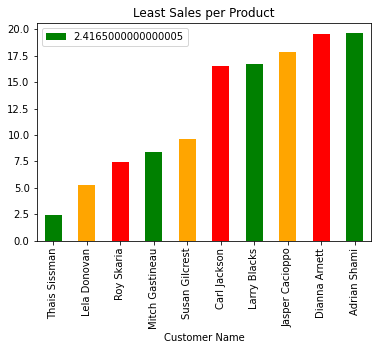

In [37]:
# Least Sales per Customer
L_data_top_Sales_chart.plot.bar(x=L_data_top_Sales_chart.index, y=L_data_top_Sales_chart, color = ['green','orange','red'],title='Least Sales per Product').legend(labels=L_data_top_Sales_chart.tolist())

<h1>City and State Purchases

In [38]:
print('The data is for the country {}'.format(data.Country.unique().tolist()[0]))
print('with States of count {}'.format(len(data.State.unique().tolist())))
print('with City of count {}'.format(len(data.City.unique().tolist())))

state_data = data.State.unique().tolist()
city_data = data.City.unique().tolist()

The data is for the country United States
with States of count 49
with City of count 531


In [39]:
# Profit per State
data_profit_per_state = data.groupby('State').Profit.mean().sort_values(ascending=False).head(10)
L_data_profit_per_state = data.groupby('State').Profit.mean().sort_values(ascending=True).head(10)
print(data_profit_per_state.head(10))

State
Vermont                 204.088936
Rhode Island            130.100523
Indiana                 123.375411
Montana                 122.221900
Minnesota               121.608847
District of Columbia    105.958930
Delaware                103.930988
Wyoming                 100.196000
Missouri                 97.518341
Michigan                 95.934069
Name: Profit, dtype: float64


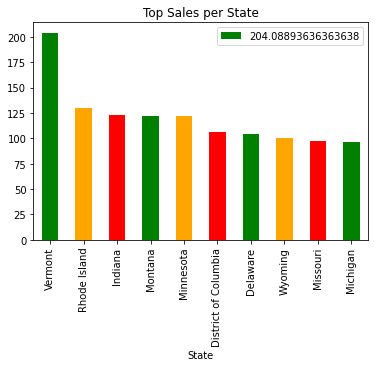

In [40]:
# Top Profits per State
data_profit_per_state.plot.bar(x=data_profit_per_state.index, y=data_profit_per_state, color = ['green','orange','red'],title='Top Sales per State').legend(labels=data_profit_per_state.tolist())

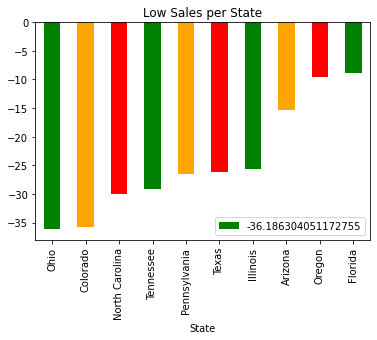

In [41]:
# Low Profits per State
L_data_profit_per_state.plot.bar(x=L_data_profit_per_state.index, y=L_data_profit_per_state, color = ['green','orange','red'],title='Low Sales per State').legend(labels=L_data_profit_per_state.tolist())

In [42]:
# Profit per City
data_profit_per_city = data.groupby('City').Profit.mean().sort_values(ascending=False).head(10)
L_data_profit_per_city = data.groupby('City').Profit.mean().sort_values(ascending=True).head(10)
print(data_profit_per_city.head(10))

City
Jamestown       642.885750
Independence    487.831500
Lafayette       323.173794
Minneapolis     296.721070
Appleton        277.383150
Morristown      262.603871
Burbank         254.844600
Lehi            225.831300
Beverly         218.306467
Warwick         212.759120
Name: Profit, dtype: float64


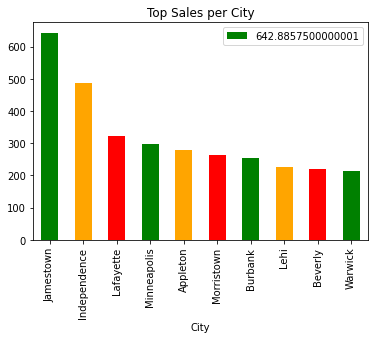

In [43]:
# Top Profits per State
data_profit_per_city.plot.bar(x=data_profit_per_city.index, y=data_profit_per_city, color = ['green','orange','red'],title='Top Sales per City').legend(labels=data_profit_per_city.tolist())

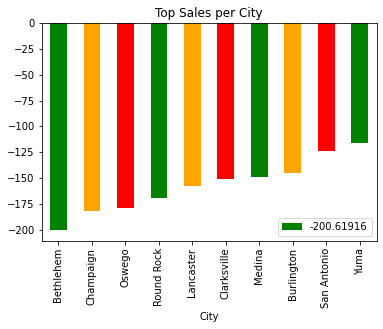

In [44]:
# Low Sales per State
L_data_profit_per_city.plot.bar(x=L_data_profit_per_city.index, y=L_data_profit_per_city, color = ['green','orange','red'],title='Top Sales per City').legend(labels=L_data_profit_per_city.tolist())

<b>Actions taken for data cleaning and feature engineering

In [45]:
Filtered_data = data[['Product Name','Sales','Quantity','Discount','Profit']]

Filtered_data.columns

Index(['Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'], dtype='object')

In [129]:
sns.pairplot(Filtered_data,hue='Product Name',size=3)

<h3>Task 2.Develop a recommendation engine for user and state to obtain high profits and Sales

In [47]:
data.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'Number of Purchases'],
      dtype='object')

In [48]:
#Creating Dummy variables
# Get a Pd.Series consisting of all the string categoricals
one_hot_encode_cols = data.dtypes[data.dtypes == np.object]  # filtering by string categoricals
one_hot_encode_cols

Order ID         object
Ship Mode        object
Customer ID      object
Customer Name    object
Segment          object
Country          object
City             object
State            object
Region           object
Product ID       object
Category         object
Sub-Category     object
Product Name     object
dtype: object

In [49]:
one_hot_encode_cols = one_hot_encode_cols.index.tolist()  # list of categorical fields

data[one_hot_encode_cols].head().T

,0,1,2,3,4
Order ID,CA-2016-152156,CA-2016-152156,CA-2016-138688,US-2015-108966,US-2015-108966
Ship Mode,Second Class,Second Class,Second Class,Standard Class,Standard Class
Customer ID,CG-12520,CG-12520,DV-13045,SO-20335,SO-20335
Customer Name,Claire Gute,Claire Gute,Darrin Van Huff,Sean O'Donnell,Sean O'Donnell
Segment,Consumer,Consumer,Corporate,Consumer,Consumer
Country,United States,United States,United States,United States,United States
City,Henderson,Henderson,Los Angeles,Fort Lauderdale,Fort Lauderdale
State,Kentucky,Kentucky,California,Florida,Florida
Region,South,South,West,South,South
Product ID,FUR-BO-10001798,FUR-CH-10000454,OFF-LA-10000240,FUR-TA-10000577,OFF-ST-10000760


In [50]:
# Do the one hot encoding
encode = pd.get_dummies(data, columns=['Product Name'], drop_first=True)
encode.describe().T

,count,mean,std,min,25%,50%,75%,max
Row ID,9994.0,4997.500000,2885.163629,1.000,2499.25,4997.50,7495.75,9994.00
Postal Code,9994.0,55190.379428,32063.693350,1040.000,23223.00,56430.50,90008.00,99301.00
Sales,9994.0,229.858001,623.245101,0.444,17.28,54.49,209.94,22638.48
Quantity,9994.0,3.789574,2.225110,1.000,2.00,3.00,5.00,14.00
Discount,9994.0,0.156203,0.206452,0.000,0.00,0.20,0.20,0.80
...,...,...,...,...,...,...,...,...
"Product Name_iKross Bluetooth Portable Keyboard + Cell Phone Stand Holder + Brush for Apple iPhone 5S 5C 5, 4S 4",9994.0,0.000500,0.022363,0.000,0.00,0.00,0.00,1.00
Product Name_iOttie HLCRIO102 Car Mount,9994.0,0.000500,0.022363,0.000,0.00,0.00,0.00,1.00
Product Name_iOttie XL Car Mount,9994.0,0.000200,0.014146,0.000,0.00,0.00,0.00,1.00
Product Name_invisibleSHIELD by ZAGG Smudge-Free Screen Protector,9994.0,0.000700,0.026458,0.000,0.00,0.00,0.00,1.00


In [51]:
encode_temp = encode.copy()

encode_columns = encode_temp.columns.tolist()

encode_columns[21:]

['Product Name_#10 Gummed Flap White Envelopes, 100/Box',
 'Product Name_#10 Self-Seal White Envelopes',
 'Product Name_#10 White Business Envelopes,4 1/8 x 9 1/2',
 'Product Name_#10- 4 1/8" x 9 1/2" Recycled Envelopes',
 'Product Name_#10- 4 1/8" x 9 1/2" Security-Tint Envelopes',
 'Product Name_#10-4 1/8" x 9 1/2" Premium Diagonal Seam Envelopes',
 'Product Name_#6 3/4 Gummed Flap White Envelopes',
 'Product Name_1.7 Cubic Foot Compact "Cube" Office Refrigerators',
 'Product Name_1/4 Fold Party Design Invitations & White Envelopes, 24 8-1/2" X 11" Cards, 25 Env./Pack',
 'Product Name_12 Colored Short Pencils',
 'Product Name_12-1/2 Diameter Round Wall Clock',
 'Product Name_14-7/8 x 11 Blue Bar Computer Printout Paper',
 'Product Name_2300 Heavy-Duty Transfer File Systems by Perma',
 'Product Name_24 Capacity Maxi Data Binder Racks, Pearl',
 'Product Name_24-Hour Round Wall Clock',
 'Product Name_3-ring staple pack',
 'Product Name_3.6 Cubic Foot Counter Height Office Refrigerator',

In [52]:
encode_temp = encode_temp[encode_columns[21:]]

encode_temp.describe().T

,count,mean,std,min,25%,50%,75%,max
"Product Name_#10 Gummed Flap White Envelopes, 100/Box",9994.0,0.000400,0.020003,0.0,0.0,0.0,0.0,1.0
Product Name_#10 Self-Seal White Envelopes,9994.0,0.000400,0.020003,0.0,0.0,0.0,0.0,1.0
"Product Name_#10 White Business Envelopes,4 1/8 x 9 1/2",9994.0,0.000700,0.026458,0.0,0.0,0.0,0.0,1.0
"Product Name_#10- 4 1/8"" x 9 1/2"" Recycled Envelopes",9994.0,0.001001,0.031618,0.0,0.0,0.0,0.0,1.0
"Product Name_#10- 4 1/8"" x 9 1/2"" Security-Tint Envelopes",9994.0,0.000800,0.028283,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...
"Product Name_iKross Bluetooth Portable Keyboard + Cell Phone Stand Holder + Brush for Apple iPhone 5S 5C 5, 4S 4",9994.0,0.000500,0.022363,0.0,0.0,0.0,0.0,1.0
Product Name_iOttie HLCRIO102 Car Mount,9994.0,0.000500,0.022363,0.0,0.0,0.0,0.0,1.0
Product Name_iOttie XL Car Mount,9994.0,0.000200,0.014146,0.0,0.0,0.0,0.0,1.0
Product Name_invisibleSHIELD by ZAGG Smudge-Free Screen Protector,9994.0,0.000700,0.026458,0.0,0.0,0.0,0.0,1.0


In [53]:
Association_list_main = encode_temp.T

Association_list_main.index

Index(['Product Name_#10 Gummed Flap White Envelopes, 100/Box',
       'Product Name_#10 Self-Seal White Envelopes',
       'Product Name_#10 White Business Envelopes,4 1/8 x 9 1/2',
       'Product Name_#10- 4 1/8" x 9 1/2" Recycled Envelopes',
       'Product Name_#10- 4 1/8" x 9 1/2" Security-Tint Envelopes',
       'Product Name_#10-4 1/8" x 9 1/2" Premium Diagonal Seam Envelopes',
       'Product Name_#6 3/4 Gummed Flap White Envelopes',
       'Product Name_1.7 Cubic Foot Compact "Cube" Office Refrigerators',
       'Product Name_1/4 Fold Party Design Invitations & White Envelopes, 24 8-1/2" X 11" Cards, 25 Env./Pack',
       'Product Name_12 Colored Short Pencils',
       ...
       'Product Name_Zebra ZM400 Thermal Label Printer',
       'Product Name_Zebra Zazzle Fluorescent Highlighters',
       'Product Name_Zipper Ring Binder Pockets',
       'Product Name_i.Sound Portable Power - 8000 mAh',
       'Product Name_iHome FM Clock Radio with Lightning Dock',
       'Product Nam

<h2> Applying Association Rules

In [54]:
#Packages Used for Applying Association Rules
import pandas as pd
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from mlxtend.preprocessing import TransactionEncoder

In [55]:
Association_list_main.head()

,0,1,2,3,4,5,6,7,8,9,...,9984,9985,9986,9987,9988,9989,9990,9991,9992,9993
"Product Name_#10 Gummed Flap White Envelopes, 100/Box",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Product Name_#10 Self-Seal White Envelopes,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Product Name_#10 White Business Envelopes,4 1/8 x 9 1/2",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Product Name_#10- 4 1/8"" x 9 1/2"" Recycled Envelopes",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Product Name_#10- 4 1/8"" x 9 1/2"" Security-Tint Envelopes",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [56]:
### Frequent items with Apriori

frequent_items_list = apriori(Association_list_main, min_support=0.0006, use_colnames=True)

frequent_items_list

,support,itemsets


Apriori can be very memory intensive when you use a to low minimum support.

Recommendation Engine based on KNN

In [57]:
from surprise import Reader
from surprise import Dataset
from surprise import KNNBasic
from collections import defaultdict
import heapq
from surprise.model_selection import train_test_split

The number of users is 793
The number of Products is 1850


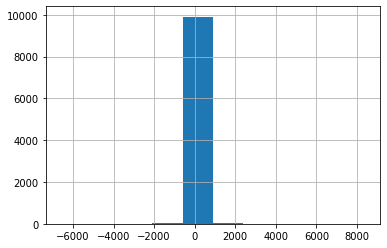

In [58]:
print("The number of users is {}".format(data['Customer Name'].nunique()))

print("The number of Products is {}".format(data['Product Name'].nunique()))

data['Profit Integer'] = data['Profit'].astype('int64')

data['Profit Integer'].hist(grid=True)

The number of users is 793
The number of Products is 1850


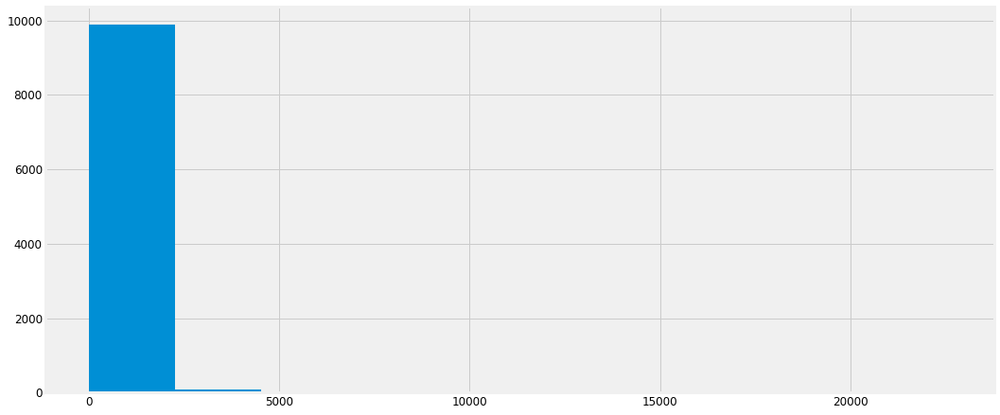

In [130]:
print("The number of users is {}".format(data['Customer Name'].nunique()))

print("The number of Products is {}".format(data['Product Name'].nunique()))

data['Sales Integer'] = data['Sales'].astype('int64')

data['Sales Integer'].hist(grid=True)

In [59]:
# data.dtypes
data['Profit Integer'].min()

-6599

In [133]:
data['Sales Integer'].min()

0

In [60]:
reader = Reader(rating_scale=(data['Profit Integer'].min(),data['Profit Integer'].max()))
load_data = Dataset.load_from_df(data[['Customer Name','Product Name','Profit Integer']], reader)
load_data_per_state = Dataset.load_from_df(data[['State','Product Name','Profit Integer']], reader)

In [134]:
reader_sales = Reader(rating_scale=(data['Sales Integer'].min(),data['Sales Integer'].max()))
load_data_sales = Dataset.load_from_df(data[['Customer Name','Product Name','Sales Integer']], reader)
load_data_per_state_sales = Dataset.load_from_df(data[['State','Product Name','Sales Integer']], reader)

### Split the data into test and train

We do this so that we can build the collaboration filtering on training and use the test data to verify how well we learned the recommendation. 

**NOTE**: Recommendation system is still unsupervised learning, we are using the test data only to validate our results. 


In [61]:
trainset, testset = train_test_split(load_data, test_size =0.25, random_state = 1)
trainset_per_state, testset_per_state = train_test_split(load_data_per_state, test_size =0.25, random_state = 1)

In [135]:
trainset_s, testset_s = train_test_split(load_data_sales, test_size =0.25, random_state = 1)
trainset_per_state_s, testset_per_state_s = train_test_split(load_data_per_state_sales, test_size =0.25, random_state = 1)

In [62]:
sim_options = {'name':'cosine', 'user_based':True}
algo = KNNBasic(sim_options=sim_options)
algo.fit(trainset)

predictions = algo.test(testset)
predictions_per_state = algo.test(testset_per_state)

Computing the cosine similarity matrix...
Done computing similarity matrix.


C:\Users\SAI\Anaconda3\lib\site-packages\surprise\prediction_algorithms\algo_base.py:249: RuntimeWarning: invalid value encountered in double_scalars
  sim = construction_func[name](*args)


**NOTE**: The following utility is written to pick the top-n prediction of products for each user to get high profits. 

In [63]:
def get_top_n(predictions, n = 10):
    # First map the predictions to each user. 
    byUser = defaultdict(list)
    for p in predictions:
        byUser[p.uid].append(p)
    
    # For each user, reduce predictions to top-n
    for uid, userPredictions in byUser.items():
        byUser[uid] = heapq.nlargest(n, userPredictions, key=lambda p: p.est)
    return byUser

In [64]:
top_n = get_top_n(predictions, n= 4)
top_n_per_state = get_top_n(predictions_per_state, n= 4)

Top-4 recommendations items for each user to get high profits

In [65]:
print('Top-4 recommendations items for each user to get high profits')
for uid, profit in list(top_n.items())[:5]:
    print('User {}'.format(uid))
    for prediction in profit:
        print(' Item {0.iid} to get profit ({0.est:.2f})\n'.format(prediction), end = '')
    print()


Top-4 recommendations items for each user to get high profits
User Maria Etezadi
 Item Ibico Hi-Tech Manual Binding System to get profit (29.46)
 Item Computer Printout Paper with Letter-Trim Perforations to get profit (29.46)
 Item GBC White Gloss Covers, Plain Front to get profit (29.46)
 Item Ibico Plastic Spiral Binding Combs to get profit (29.46)

User Zuschuss Donatelli
 Item Jabra SPEAK 410 Multidevice Speakerphone to get profit (29.46)
 Item Newell 341 to get profit (29.46)
 Item Wilson Jones Hanging View Binder, White, 1" to get profit (29.46)

User Daniel Byrd
 Item Vtech CS6719 to get profit (29.46)
 Item O'Sullivan 3-Shelf Heavy-Duty Bookcases to get profit (29.46)
 Item Eldon Expressions Punched Metal & Wood Desk Accessories, Black & Cherry to get profit (29.46)
 Item Smead Alpha-Z Color-Coded Second Alphabetical Labels and Starter Set to get profit (29.46)

User Seth Vernon
 Item Global Troy Executive Leather Low-Back Tilter to get profit (29.46)
 Item Bush Somerset Colle

Top-4 recommendations items for each State to get high profits

In [66]:
print('Top-4 recommendations items for each State to get high profits')
for uid, profit in list(top_n_per_state.items())[:5]:
    print('State {}'.format(uid))
    for prediction in profit:
        print(' Item {0.iid} to get profit ({0.est:.2f})\n'.format(prediction), end = '')
    print()

Top-4 recommendations items for each State to get high profits
State Kentucky
 Item Ibico Hi-Tech Manual Binding System to get profit (29.46)
 Item Vtech CS6719 to get profit (29.46)
 Item ACCOHIDE 3-Ring Binder, Blue, 1" to get profit (29.46)
 Item Panasonic KP-350BK Electric Pencil Sharpener with Auto Stop to get profit (29.46)

State Florida
 Item Jabra SPEAK 410 Multidevice Speakerphone to get profit (29.46)
 Item Dana Swing-Arm Lamps to get profit (29.46)
 Item O'Sullivan 2-Shelf Heavy-Duty Bookcases to get profit (29.46)
 Item Global Comet Stacking Armless Chair to get profit (29.46)

State New York
 Item Global Troy Executive Leather Low-Back Tilter to get profit (29.46)
 Item Ampad Gold Fibre Wirebound Steno Books, 6" x 9", Gregg Ruled to get profit (29.46)
 Item Kensington 6 Outlet SmartSocket Surge Protector to get profit (29.46)
 Item Acme Design Line 8" Stainless Steel Bent Scissors w/Champagne Handles, 3-1/8" Cut to get profit (29.46)

State Ohio
 Item Hoover Commercial Li

In [136]:
sim_options = {'name':'cosine', 'user_based':True}
algo = KNNBasic(sim_options=sim_options)
algo.fit(trainset_s)

predictions_s = algo.test(testset_s)
predictions_per_state_s = algo.test(testset_per_state_s)

Computing the cosine similarity matrix...
Done computing similarity matrix.


In [137]:
top_n_s = get_top_n(predictions_s, n= 4)
top_n_per_state_s = get_top_n(predictions_per_state_s, n= 4)

Top-4 recommendations items for each user to get high profits

In [139]:
print('Top-4 recommendations items for each user to get high Sales')
for uid, profit in list(top_n_s.items())[:5]:
    print('User {}'.format(uid))
    for prediction in profit:
        print(' Item {0.iid} to get profit ({0.est:.2f})\n'.format(prediction), end = '')
    print()


Top-4 recommendations items for each user to get high Sales
User Maria Etezadi
 Item Ibico Hi-Tech Manual Binding System to get profit (232.00)
 Item Computer Printout Paper with Letter-Trim Perforations to get profit (232.00)
 Item GBC White Gloss Covers, Plain Front to get profit (232.00)
 Item Ibico Plastic Spiral Binding Combs to get profit (232.00)

User Zuschuss Donatelli
 Item Jabra SPEAK 410 Multidevice Speakerphone to get profit (232.00)
 Item Newell 341 to get profit (232.00)
 Item Wilson Jones Hanging View Binder, White, 1" to get profit (232.00)

User Daniel Byrd
 Item Vtech CS6719 to get profit (232.00)
 Item O'Sullivan 3-Shelf Heavy-Duty Bookcases to get profit (232.00)
 Item Eldon Expressions Punched Metal & Wood Desk Accessories, Black & Cherry to get profit (232.00)
 Item Smead Alpha-Z Color-Coded Second Alphabetical Labels and Starter Set to get profit (232.00)

User Seth Vernon
 Item Global Troy Executive Leather Low-Back Tilter to get profit (1603.00)
 Item Riversid

Top-4 recommendations items for each State to get high Sales

In [140]:
print('Top-4 recommendations items for each State to get high Sales')
for uid, profit in list(top_n_per_state_s.items())[:5]:
    print('State {}'.format(uid))
    for prediction in profit:
        print(' Item {0.iid} to get profit ({0.est:.2f})\n'.format(prediction), end = '')
    print()

Top-4 recommendations items for each State to get high Sales
State Kentucky
 Item Ibico Hi-Tech Manual Binding System to get profit (232.00)
 Item Vtech CS6719 to get profit (232.00)
 Item ACCOHIDE 3-Ring Binder, Blue, 1" to get profit (232.00)
 Item Panasonic KP-350BK Electric Pencil Sharpener with Auto Stop to get profit (232.00)

State Florida
 Item Jabra SPEAK 410 Multidevice Speakerphone to get profit (232.00)
 Item Dana Swing-Arm Lamps to get profit (232.00)
 Item O'Sullivan 2-Shelf Heavy-Duty Bookcases to get profit (232.00)
 Item Global Comet Stacking Armless Chair to get profit (232.00)

State New York
 Item Global Troy Executive Leather Low-Back Tilter to get profit (232.00)
 Item Ampad Gold Fibre Wirebound Steno Books, 6" x 9", Gregg Ruled to get profit (232.00)
 Item Kensington 6 Outlet SmartSocket Surge Protector to get profit (232.00)
 Item Acme Design Line 8" Stainless Steel Bent Scissors w/Champagne Handles, 3-1/8" Cut to get profit (232.00)

State Ohio
 Item Hoover Com

<h3><b>Task 3:</b>	Perform Anomaly detection on any of the single feature (profit/sales) to identify outliers 

In [67]:
# plt.style.use(['fivethirtyeight', 'dark_background'])

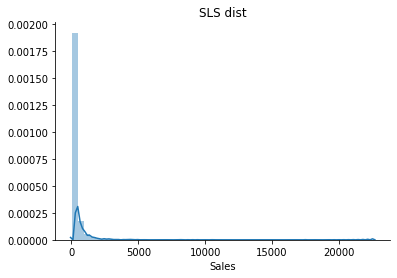

In [68]:
#Let's check the distribution of Sales attribute
sns.distplot(df['Sales'])
plt.title('SLS dist')
sns.despine()

In [69]:
print('Kurtosis: %f' % df['Sales'].kurt())
print('Skewness: %f' % df['Sales'].skew())

Kurtosis: 305.311753
Skewness: 12.972752


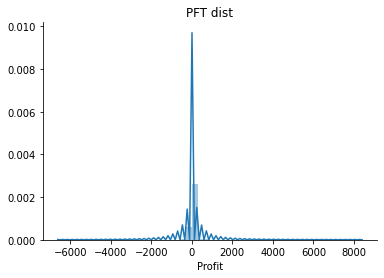

In [70]:
#Let's check the distribution of Profit attribute
sns.distplot(df['Profit'])
plt.title('PFT dist')
sns.despine()

In [71]:
print('Kurtosis: %f' % df['Profit'].kurt())
print('Skewness: %f' % df['Profit'].skew())

Kurtosis: 397.188515
Skewness: 7.561432


In [72]:
## Using "Isolationforest algorithm" for detecting anomalies in the dataset. 
# ifo isolates observations and creates partition trees through random selection of features. Followed by random selection of a split value between max & min value of a selected feature.
from sklearn.ensemble import IsolationForest

In [73]:
# Specifying the model .

# Train on sales.     
ifo = IsolationForest(n_estimators = 100)

ifo.fit(df['Sales'].values.reshape(-1, 1))

# Store in NumPy array.
min_max = np.linspace(df['Sales'].min(),
                      df['Sales'].max(), 
                      len(df)).reshape(-1, 1)
# Compute anomaly score for each observation 
    # input score is computed as the mean score of all trees 
anomaly_score = ifo.decision_function(min_max)

# Classify each observation as outlier or not
outliers = ifo.predict(min_max)


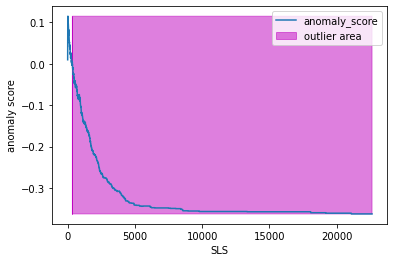

In [74]:
plt.plot(min_max, anomaly_score, label = 'anomaly_score')

plt.fill_between(min_max.T[0], 
                 np.min(anomaly_score), 
                 np.max(anomaly_score),
                 where = outliers == -1, 
                 color = 'm',
                 alpha = .5, 
                 label = 'outlier area')

plt.legend()
plt.xlabel('SLS')
plt.ylabel('anomaly score')
plt.show();

In [75]:
# SLS > 1000 = outliers
# Outliers appear as anomaly score decreases.

df.loc[df['Sales'] > 1000].head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
10,11,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,...,90032,West,FUR-TA-10001539,Furniture,Tables,Chromcraft Rectangular Conference Tables,1706.184,9,0.2,85.3092
24,25,CA-2015-106320,2015-09-25,2015-09-30,Standard Class,EB-13870,Emily Burns,Consumer,United States,Orem,...,84057,West,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,1044.630,3,0.0,240.2649
27,28,US-2015-150630,2015-09-17,2015-09-21,Standard Class,TB-21520,Tracy Blumstein,Consumer,United States,Philadelphia,...,19140,East,FUR-BO-10004834,Furniture,Bookcases,"Riverside Palais Royal Lawyers Bookcase, Royal...",3083.430,7,0.5,-1665.0522
35,36,CA-2016-117590,2016-12-08,2016-12-10,First Class,GH-14485,Gene Hale,Corporate,United States,Richardson,...,75080,Central,TEC-PH-10004977,Technology,Phones,GE 30524EE4,1097.544,7,0.2,123.4737
54,55,CA-2016-105816,2016-12-11,2016-12-17,Standard Class,JM-15265,Janet Molinari,Corporate,United States,New York City,...,10024,East,TEC-PH-10002447,Technology,Phones,AT&T CL83451 4-Handset Telephone,1029.950,5,0.0,298.6855


In [76]:
# Check index 10 
df.iloc[10]

Row ID                                                 11
Order ID                                   CA-2014-115812
Order Date                            2014-06-09 00:00:00
Ship Date                             2014-06-14 00:00:00
Ship Mode                                  Standard Class
Customer ID                                      BH-11710
Customer Name                             Brosina Hoffman
Segment                                          Consumer
Country                                     United States
City                                          Los Angeles
State                                          California
Postal Code                                         90032
Region                                               West
Product ID                                FUR-TA-10001539
Category                                        Furniture
Sub-Category                                       Tables
Product Name     Chromcraft Rectangular Conference Tables
Sales         

From the above information it doesn't seem out of order.

In [77]:
# Defining profit (PFT) acceptable range.

ifo = IsolationForest(n_estimators = 100)

ifo.fit(df['Profit'].values.reshape(-1, 1))

min_max = np.linspace(df['Profit'].min(),
                      df['Profit'].max(),
                      len(df)).reshape(-1, 1)

anomaly_score = ifo.decision_function(min_max)

outliers = ifo.predict(min_max)

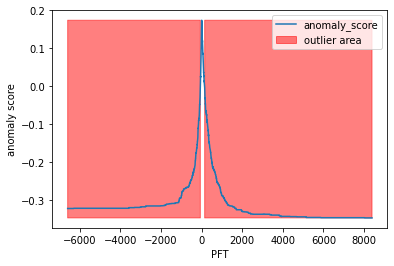

In [78]:
plt.plot(min_max, anomaly_score, label = 'anomaly_score')
plt.fill_between(min_max.T[0], 
                 np.min(anomaly_score),
                 np.max(anomaly_score),
                 where = outliers == -1,
                 color = 'r',
                 alpha = 0.5, 
                 label = 'outlier area')

plt.legend()
plt.xlabel('PFT')
plt.ylabel('anomaly score')
plt.show();

Acceptable criteria for profit: -100 > PFT > 100 = outlier

In [79]:
df.loc[df['Profit'] > 100].head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.940,3,0.0,219.5820
13,14,CA-2016-161389,2016-12-05,2016-12-10,Standard Class,IM-15070,Irene Maddox,Consumer,United States,Seattle,...,98103,West,OFF-BI-10003656,Office Supplies,Binders,Fellowes PB200 Plastic Comb Binding Machine,407.976,3,0.2,132.5922
24,25,CA-2015-106320,2015-09-25,2015-09-30,Standard Class,EB-13870,Emily Burns,Consumer,United States,Orem,...,84057,West,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,1044.630,3,0.0,240.2649
35,36,CA-2016-117590,2016-12-08,2016-12-10,First Class,GH-14485,Gene Hale,Corporate,United States,Richardson,...,75080,Central,TEC-PH-10004977,Technology,Phones,GE 30524EE4,1097.544,7,0.2,123.4737
54,55,CA-2016-105816,2016-12-11,2016-12-17,Standard Class,JM-15265,Janet Molinari,Corporate,United States,New York City,...,10024,East,TEC-PH-10002447,Technology,Phones,AT&T CL83451 4-Handset Telephone,1029.950,5,0.0,298.6855


In [80]:
df.iloc[54]

Row ID                                         55
Order ID                           CA-2016-105816
Order Date                    2016-12-11 00:00:00
Ship Date                     2016-12-17 00:00:00
Ship Mode                          Standard Class
Customer ID                              JM-15265
Customer Name                      Janet Molinari
Segment                                 Corporate
Country                             United States
City                                New York City
State                                    New York
Postal Code                                 10024
Region                                       East
Product ID                        TEC-PH-10002447
Category                               Technology
Sub-Category                               Phones
Product Name     AT&T CL83451 4-Handset Telephone
Sales                                     1029.95
Quantity                                        5
Discount                                        0


From the above information: Model determined 54 to be outlier, it could possibly be a product with higher margins.

In [81]:
df.loc[df['Profit'] < -100].head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
14,15,US-2015-118983,2015-11-22,2015-11-26,Standard Class,HP-14815,Harold Pawlan,Home Office,United States,Fort Worth,...,76106,Central,OFF-AP-10002311,Office Supplies,Appliances,Holmes Replacement Filter for HEPA Air Cleaner...,68.8100,5,0.80,-123.8580
27,28,US-2015-150630,2015-09-17,2015-09-21,Standard Class,TB-21520,Tracy Blumstein,Consumer,United States,Philadelphia,...,19140,East,FUR-BO-10004834,Furniture,Bookcases,"Riverside Palais Royal Lawyers Bookcase, Royal...",3083.4300,7,0.50,-1665.0522
36,37,CA-2016-117590,2016-12-08,2016-12-10,First Class,GH-14485,Gene Hale,Corporate,United States,Richardson,...,75080,Central,FUR-FU-10003664,Furniture,Furnishings,"Electrix Architect's Clamp-On Swing Arm Lamp, ...",190.9200,5,0.60,-147.9630
72,73,US-2015-134026,2015-04-26,2015-05-02,Standard Class,JE-15745,Joel Eaton,Consumer,United States,Memphis,...,38109,South,FUR-CH-10000513,Furniture,Chairs,High-Back Leather Manager's Chair,831.9360,8,0.20,-114.3912


In [82]:
df.iloc[27]

Row ID                                                          28
Order ID                                            US-2015-150630
Order Date                                     2015-09-17 00:00:00
Ship Date                                      2015-09-21 00:00:00
Ship Mode                                           Standard Class
Customer ID                                               TB-21520
Customer Name                                      Tracy Blumstein
Segment                                                   Consumer
Country                                              United States
City                                                  Philadelphia
State                                                 Pennsylvania
Postal Code                                                  19140
Region                                                        East
Product ID                                         FUR-BO-10004834
Category                                                 Furni

In [83]:
# Using "Multivariate" anomaly detection to find out the outliers in the dataset.
# Available unsupervised models: KNN / CBLOF / HBOS /  Isolation Forest

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

!pip install pyod
from pyod.models.abod import ABOD
from pyod.models.cblof import CBLOF

from pyod.models.feature_bagging import FeatureBagging
from pyod.models.hbos import HBOS
from pyod.models.iforest import IForest
from pyod.models.knn import KNN
from pyod.models.lof import LOF

from scipy import stats

from numpy import percentile
import matplotlib

C:\Users\SAI\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)


In [84]:
df = df.rename(columns = {'Sales': 'SLS', 'Profit': 'PFT'})
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,SLS,Quantity,Discount,PFT
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [85]:
cols = ['SLS', 'PFT']
df[cols].head()

,SLS,PFT
0,261.9600,41.9136
1,731.9400,219.5820
2,14.6200,6.8714
3,957.5775,-383.0310
4,22.3680,2.5164


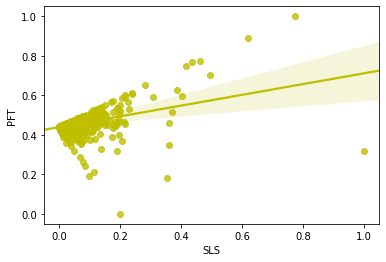

In [86]:
# Scaling features for Profit (PFT) & Sales (SLS) and creating error contour levels must be increasing.

minmax = MinMaxScaler(feature_range = (0, 1))
df[['SLS','PFT']] = minmax.fit_transform(df[['SLS','PFT']])
df[['SLS','PFT']].head()

# corr positive correlation
# Plot corr
sns.regplot(x = 'SLS', 
            y = 'PFT', data = df,
            color = 'y')

In [87]:
# Points that are non-positive corr = outliers in the dataset.

X1 = df['SLS'].values.reshape(-1,1)
X2 = df['PFT'].values.reshape(-1,1)

X = np.concatenate((X1,X2),axis=1)

OUTLIERS:  91 INLIERS:  9903


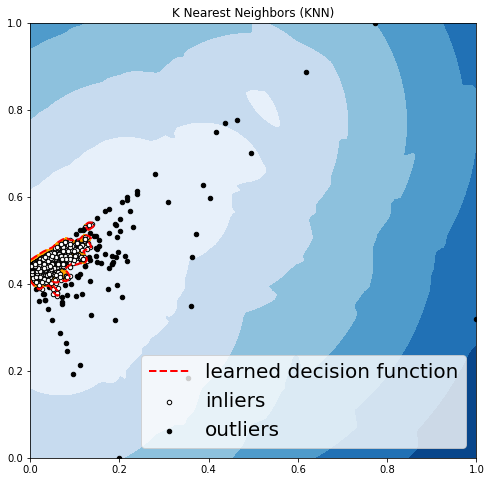

In [88]:
outliers_fraction = 0.01
xx , yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
clf = KNN(contamination=outliers_fraction)
clf.fit(X)
scores_pred = clf.decision_function(X) * -1
y_pred = clf.predict(X)
n_inliers = len(y_pred) - np.count_nonzero(y_pred)
n_outliers = np.count_nonzero(y_pred == 1)
plt.figure(figsize=(8, 8))

# Prediction of dataframe.
df1 = df
df1['outlier'] = y_pred.tolist()
    
# sales - inlier feature 1,  profit - inlier feature 2.
inliers_sales = np.array(df1['SLS'][df1['outlier'] == 0]).reshape(-1,1)
inliers_profit = np.array(df1['PFT'][df1['outlier'] == 0]).reshape(-1,1)
    
# sales - outlier feature 1, profit - outlier feature 2.
outliers_sales = df1['SLS'][df1['outlier'] == 1].values.reshape(-1,1)
outliers_profit = df1['PFT'][df1['outlier'] == 1].values.reshape(-1,1)
         
print('OUTLIERS: ',n_outliers,'INLIERS: ',n_inliers)

threshold = percentile(scores_pred, 100 * outliers_fraction)

Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),cmap=plt.cm.Blues_r)
a = plt.contour(xx, yy, Z, levels=[threshold],linewidths=2, colors='red')
plt.contourf(xx, yy, Z, levels=[threshold, Z.max()],colors='orange')
b = plt.scatter(inliers_sales, inliers_profit, c='white',s=20, edgecolor='k')    
c = plt.scatter(outliers_sales, outliers_profit, c='black',s=20, edgecolor='k')  

plt.axis('tight')  
plt.legend([a.collections[0], b,c], ['learned decision function', 'inliers','outliers'],
           prop=matplotlib.font_manager.FontProperties(size=20),loc='lower right')      
plt.xlim((0, 1))
plt.ylim((0, 1))
plt.title('K Nearest Neighbors (KNN)')
plt.show();

- Isolation forest: Isolate observations through random feature selection in the dataset.
- Appliying logic: Random select a split value between maximum and minimum values of selected feature.

OUTLIERS:  100 INLIERS:  9894


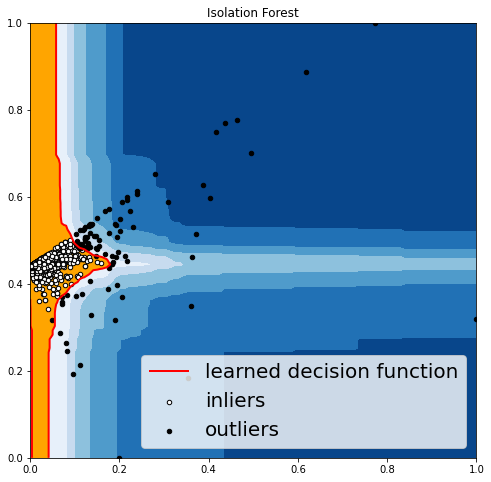

In [89]:
outliers_fraction = 0.01
xx , yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
clf = IForest(contamination=outliers_fraction,random_state=0)
clf.fit(X)
scores_pred = clf.decision_function(X) * -1

y_pred = clf.predict(X)
n_inliers = len(y_pred) - np.count_nonzero(y_pred)
n_outliers = np.count_nonzero(y_pred == 1)
plt.figure(figsize=(8, 8))

df1 = df
df1['outlier'] = y_pred.tolist()
    
# sales - inlier feature 1,  profit - inlier feature 2
inliers_sales = np.array(df1['SLS'][df1['outlier'] == 0]).reshape(-1,1)
inliers_profit = np.array(df1['PFT'][df1['outlier'] == 0]).reshape(-1,1)
    
# sales - outlier feature 1, profit - outlier feature 2
outliers_sales = df1['SLS'][df1['outlier'] == 1].values.reshape(-1,1)
outliers_profit = df1['PFT'][df1['outlier'] == 1].values.reshape(-1,1)
         
print('OUTLIERS: ',n_outliers,'INLIERS: ',n_inliers)

threshold = percentile(scores_pred, 100 * outliers_fraction)
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),cmap=plt.cm.Blues_r)
a = plt.contour(xx, yy, Z, levels=[threshold],linewidths=2, colors='red')
plt.contourf(xx, yy, Z, levels=[threshold, Z.max()],colors='orange')
b = plt.scatter(inliers_sales, inliers_profit, c='white',s=20, edgecolor='k')
    
c = plt.scatter(outliers_sales, outliers_profit, c='black',s=20, edgecolor='k')
       
plt.axis('tight')
plt.legend([a.collections[0], b,c], ['learned decision function', 'inliers','outliers'],
           prop=matplotlib.font_manager.FontProperties(size=20),loc='lower right')      
plt.xlim((0, 1))
plt.ylim((0, 1))
plt.title('Isolation Forest')
plt.show();


- Applying Cluster-based Local Outlier Factor (CBLOF): Calc outlier score based on CBLOF.
- Applying logic: Anomaly score = distance of each observation to center of cluster x observations in the center.
- Scale SLS & PFT (0-1) & Set outlier fractions as 1% based on trial.
- Fit CBLOF model & identifing outlier using threshold value and also calculating anomaly score for every point using decision function.

C:\Users\SAI\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


OUTLIERS: 100 INLIERS: 9894


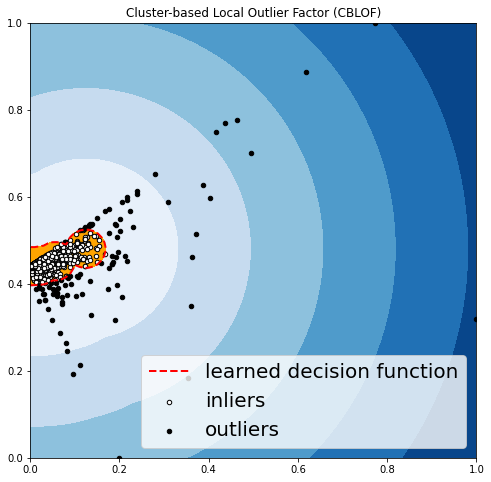

In [90]:
xx , yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))

clf = CBLOF(contamination = outliers_fraction,
            check_estimator = False, random_state = 0)
clf.fit(X)

# predict raw anomaly score
scores_pred = clf.decision_function(X) * -1
        
# Identify point as outlier or inlier
y_pred = clf.predict(X)
n_inliers = len(y_pred) - np.count_nonzero(y_pred)
n_outliers = np.count_nonzero(y_pred == 1)

# identifying features in teh dataframe
df1 = df
df1['outlier'] = y_pred.tolist() # store predictions in df
    
# 
inliers_sales = np.array(df1['SLS'][df1['outlier'] == 0]).reshape(-1,1)
inliers_profit = np.array(df1['PFT'][df1['outlier'] == 0]).reshape(-1,1)
    
# sales - outlier feature 1, profit - outlier feature 2
outliers_sales = df1['SLS'][df1['outlier'] == 1].values.reshape(-1,1)
outliers_profit = df1['PFT'][df1['outlier'] == 1].values.reshape(-1,1)
         
print('OUTLIERS:',n_outliers,
      'INLIERS:',n_inliers)

plt.figure(figsize=(8, 8))

# Threshold value for identifying outliers and inliers. 
threshold = percentile(scores_pred, 100 * outliers_fraction)
        
# decision function calculates the raw anomaly score for every point.
Z = clf.decision_function(np.c_[xx.ravel(), 
                                yy.ravel()]) * -1
Z = Z.reshape(xx.shape)
# fill blue map colormap from minimum anomaly score to threshold value.
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 
                                           threshold, 7),
             cmap = plt.cm.Blues_r)

# red contour line where anomaly score = thresold.
a = plt.contour(xx, yy, Z, 
                levels=[threshold],
                linewidths = 2, colors = 'red')
        
# orange contour lines where range of anomaly score covers threshold val to max anomaly score.
plt.contourf(xx, yy, Z, 
             levels = [threshold, Z.max()],
             colors = 'orange')

b = plt.scatter(inliers_sales, inliers_profit, 
                c = 'white',s = 20, edgecolor = 'k')
    
c = plt.scatter(outliers_sales, outliers_profit, 
                c = 'black',s=20, edgecolor = 'k')
       
plt.axis('tight')   
plt.legend([a.collections[0], b,c],
           ['learned decision function', 'inliers','outliers'],
           prop = matplotlib.font_manager.FontProperties(size = 20),
           loc = 'lower right')
      
plt.xlim((0, 1))
plt.ylim((0, 1))
plt.title('Cluster-based Local Outlier Factor (CBLOF)')
plt.show();


- Applying "Hist-based Outlier Detection (HBOS)" model based on assumption of feature independence and calculating degree of anomalies using hist.

OUTLIERS: 90 INLIERS: 9904


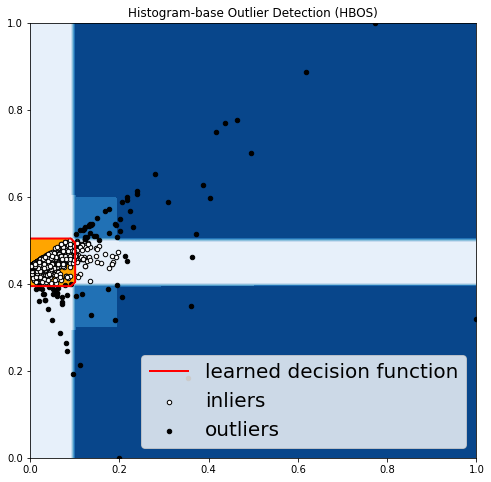

In [91]:
outliers_fraction = 0.01
xx , yy = np.meshgrid(np.linspace(0, 1, 100), 
                      np.linspace(0, 1, 100))
clf = HBOS(contamination = outliers_fraction)
clf.fit(X)

scores_pred = clf.decision_function(X) * -1
y_pred = clf.predict(X)

n_inliers = len(y_pred) - np.count_nonzero(y_pred)
n_outliers = np.count_nonzero(y_pred == 1)

plt.figure(figsize = (8, 8))

df1 = df
df1['outlier'] = y_pred.tolist()
    
inliers_sales = np.array(df1['SLS'][df1['outlier'] == 0]).reshape(-1,1)
inliers_profit = np.array(df1['PFT'][df1['outlier'] == 0]).reshape(-1,1)
    

outliers_sales = df1['SLS'][df1['outlier'] == 1].values.reshape(-1,1)
outliers_profit = df1['PFT'][df1['outlier'] == 1].values.reshape(-1,1)
         
print('OUTLIERS:',n_outliers,'INLIERS:',n_inliers)
threshold = percentile(scores_pred, 100 * outliers_fraction)

Z = clf.decision_function(np.c_[xx.ravel(), 
                                yy.ravel()]) * -1
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, 
             levels = np.linspace(Z.min(), 
                                           threshold, 7),
             cmap = plt.cm.Blues_r)

a = plt.contour(xx, yy, Z, levels = [threshold],
                linewidths=2, colors='red')

plt.contourf(xx, yy, Z, 
             levels = [threshold, Z.max()],
             colors = 'orange')

b = plt.scatter(inliers_sales, inliers_profit, 
                c ='white',s=20, edgecolor='k')
    
c = plt.scatter(outliers_sales, outliers_profit, 
                c ='black',s=20, edgecolor='k')
       
plt.axis('tight')      
plt.legend([a.collections[0], b,c], 
           ['learned decision function', 'inliers','outliers'],
           prop = matplotlib.font_manager.FontProperties(size = 20),
           loc='lower right')      

plt.xlim((0, 1))
plt.ylim((0, 1))
plt.title('Histogram-base Outlier Detection (HBOS)')
plt.show();

-  Based on the data from the analysis of the above four models predicts anomalies are very similar.

- Check predictions and displaying outliers determined by model (HBOS).

In [92]:
# Predicted outliers form the datframe.
df1.loc[df1['outlier'] == 1].tail()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Region,Product ID,Category,Sub-Category,Product Name,SLS,Quantity,Discount,PFT,outlier
9270,9271,US-2017-102183,2017-08-21,2017-08-28,Standard Class,PK-19075,Pete Kriz,Consumer,United States,New York City,...,East,OFF-BI-10001359,Office Supplies,Binders,GBC DocuBind TL300 Electric Binding System,0.190171,6,0.2,0.536875,1
9639,9640,CA-2015-116638,2015-01-28,2015-01-31,Second Class,JH-15985,Joseph Holt,Consumer,United States,Concord,...,South,FUR-TA-10000198,Furniture,Tables,Chromcraft Bull-Nose Wood Oval Conference Tabl...,0.189822,13,0.4,0.315845,1
9741,9742,CA-2015-117086,2015-11-08,2015-11-12,Standard Class,QJ-19255,Quincy Jones,Corporate,United States,Burlington,...,East,FUR-BO-10004834,Furniture,Bookcases,"Riverside Palais Royal Lawyers Bookcase, Royal...",0.194560,5,0.0,0.507542,1
9774,9775,CA-2014-169019,2014-07-26,2014-07-30,Standard Class,LF-17185,Luke Foster,Consumer,United States,San Antonio,...,Central,OFF-BI-10004995,Office Supplies,Binders,GBC DocuBind P400 Electric Binding System,0.096172,8,0.8,0.193206,1
9929,9930,CA-2016-129630,2016-09-04,2016-09-04,Same Day,IM-15055,Ionia McGrath,Consumer,United States,San Francisco,...,West,TEC-CO-10003763,Technology,Copiers,Canon PC1060 Personal Laser Copier,0.123664,5,0.2,0.502999,1


- Reloading the data to view features at original scale based on the given thresholds.

In [93]:
df = data.copy()

Outlier 1 : 9649 row

In [94]:
df.iloc[9649]

Row ID                                                  9650
Order ID                                      CA-2016-107104
Order Date                               2016-11-26 00:00:00
Ship Date                                2016-11-30 00:00:00
Ship Mode                                     Standard Class
Customer ID                                         MS-17365
Customer Name                            Maribeth Schnelling
Segment                                             Consumer
Country                                        United States
City                                             Los Angeles
State                                             California
Postal Code                                            90045
Region                                                  West
Product ID                                   FUR-BO-10002213
Category                                           Furniture
Sub-Category                                       Bookcases
Product Name           D

- quantity = 5
- discount = 15%
- total price = 3406.66
- profit = 160.314
- 0.04% profit

<p> We observed that profit is very small, so the model identified this order as outlier in the dataframe.

Outlier 2 : 9741 row

In [95]:
df.iloc[9741]

Row ID                                                              9742
Order ID                                                  CA-2015-117086
Order Date                                           2015-11-08 00:00:00
Ship Date                                            2015-11-12 00:00:00
Ship Mode                                                 Standard Class
Customer ID                                                     QJ-19255
Customer Name                                               Quincy Jones
Segment                                                        Corporate
Country                                                    United States
City                                                          Burlington
State                                                            Vermont
Postal Code                                                         5408
Region                                                              East
Product ID                                         

- Percentage of profit gained from the above indexed data: 1013 / 4404.9 = 22% profit

Outlier 3 : 9774 row

In [96]:
df.iloc[9774]

Row ID                                                      9775
Order ID                                          CA-2014-169019
Order Date                                   2014-07-26 00:00:00
Ship Date                                    2014-07-30 00:00:00
Ship Mode                                         Standard Class
Customer ID                                             LF-17185
Customer Name                                        Luke Foster
Segment                                                 Consumer
Country                                            United States
City                                                 San Antonio
State                                                      Texas
Postal Code                                                78207
Region                                                   Central
Product ID                                       OFF-BI-10004995
Category                                         Office Supplies
Sub-Category             

- Finding the negative profit possible clearance item from the dataframe

Outlier 4 : 9270 row

In [97]:
df.iloc[9270]

Row ID                                                       9271
Order ID                                           US-2017-102183
Order Date                                    2017-08-21 00:00:00
Ship Date                                     2017-08-28 00:00:00
Ship Mode                                          Standard Class
Customer ID                                              PK-19075
Customer Name                                           Pete Kriz
Segment                                                  Consumer
Country                                             United States
City                                                New York City
State                                                    New York
Postal Code                                                 10035
Region                                                       East
Product ID                                        OFF-BI-10001359
Category                                          Office Supplies
Sub-Catego

- From the above information we can say that : 20% discont 4305 total price 1453 / 4305 = 33% profit gained.

Outlier 5 : 9857 row

In [98]:
df.iloc[9857]

Row ID                                                              9858
Order ID                                                  CA-2015-164301
Order Date                                           2015-03-26 00:00:00
Ship Date                                            2015-03-30 00:00:00
Ship Mode                                                 Standard Class
Customer ID                                                     EB-13840
Customer Name                                              Ellis Ballard
Segment                                                        Corporate
Country                                                    United States
City                                                             Seattle
State                                                         Washington
Postal Code                                                        98103
Region                                                              West
Product ID                                         

- The profit is:18% gained from the above indexed sale information.

<h3>Task 4: Predicting the future sales based on Forcasting Analysis

<p> Performing forecasting analysis on Superstore Dataset
<p> Using the Time Series Analysis in order to identify: 
<p> 1. Patterns/features from the Superstore dataset & 
<p> 2. Forecating analysis by using a model to predict the future values based on historical data

In [99]:
# Import the required libraries
import itertools
plt.style.use('fivethirtyeight')
import statsmodels.api as sm
import matplotlib

matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'b'
matplotlib.rcParams['figure.facecolor'] = '1'

import warnings
warnings.filterwarnings('ignore')

C:\Users\SAI\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:23: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  data_klasses = (pandas.Series, pandas.DataFrame, pandas.Panel)


- From the dataset using the "Office Supplies" category to perform the forcasting analysis on the dataset.

In [100]:
# Extract the data of Office Supplies
office_supplies = df.loc[df['Category'] == 'Office Supplies']

In [101]:
# Office Supply data avialble for four years in the dataset
office_supplies['Order Date'].min(), office_supplies['Order Date'].max()

(Timestamp('2014-01-03 00:00:00'), Timestamp('2017-12-30 00:00:00'))

- Processing the sales data of Office Supplie by using the "Order Data" column also integrating with "Sales" data

In [102]:
office_supplies = office_supplies[['Order Date','Sales']]
office_supplies.head()

,Order Date,Sales
2,2016-06-12,14.620
4,2015-10-11,22.368
6,2014-06-09,7.280
8,2014-06-09,18.504
9,2014-06-09,114.900


In [103]:
office_supplies = office_supplies.sort_values('Order Date')
office_supplies = office_supplies.groupby('Order Date')['Sales'].sum().reset_index()
office_supplies.head()

,Order Date,Sales
0,2014-01-03,16.448
1,2014-01-04,288.060
2,2014-01-05,19.536
3,2014-01-06,685.340
4,2014-01-07,10.430


In [104]:
# Indexing with the time series data
office_supplies = office_supplies.set_index('Order Date')
office_supplies.head()

,Sales
Order Date,
2014-01-03,16.448
2014-01-04,288.060
2014-01-05,19.536
2014-01-06,685.340
2014-01-07,10.430


In [105]:
office_supplies.index

DatetimeIndex(['2014-01-03', '2014-01-04', '2014-01-05', '2014-01-06',
               '2014-01-07', '2014-01-09', '2014-01-10', '2014-01-13',
               '2014-01-16', '2014-01-18',
               ...
               '2017-12-21', '2017-12-22', '2017-12-23', '2017-12-24',
               '2017-12-25', '2017-12-26', '2017-12-27', '2017-12-28',
               '2017-12-29', '2017-12-30'],
              dtype='datetime64[ns]', name='Order Date', length=1148, freq=None)

- From the Index, datatime data is not continuous and it is difficult for us to perform the analysis. So, here using the "Average Daily Sales" value for the month. extracting the data based on Start of every month as time-stamp.

In [106]:
monthly = office_supplies['Sales'].resample('MS').mean()
monthly

Order Date
2014-01-01     285.357647
2014-02-01      63.042588
2014-03-01     391.176318
2014-04-01     464.794750
2014-05-01     324.346545
2014-06-01     588.774409
2014-07-01     756.060400
2014-08-01     541.879143
2014-09-01    1015.677704
2014-10-01     267.078815
2014-11-01     959.372714
2014-12-01     692.556231
2015-01-01     129.198571
2015-02-01     335.504187
2015-03-01     690.545522
2015-04-01     502.342320
2015-05-01     364.549440
2015-06-01     560.407737
2015-07-01     205.214739
2015-08-01     558.814667
2015-09-01     772.230680
2015-10-01     361.392083
2015-11-01     757.790357
2015-12-01     540.055800
2016-01-01     331.230125
2016-02-01     357.597368
2016-03-01     693.877240
2016-04-01     462.932478
2016-05-01     449.489724
2016-06-01     436.072400
2016-07-01     587.474727
2016-08-01     344.605385
2016-09-01     830.847786
2016-10-01     678.408083
2016-11-01     787.972231
2016-12-01    1357.055929
2017-01-01     967.013136
2017-02-01     389.882737
2

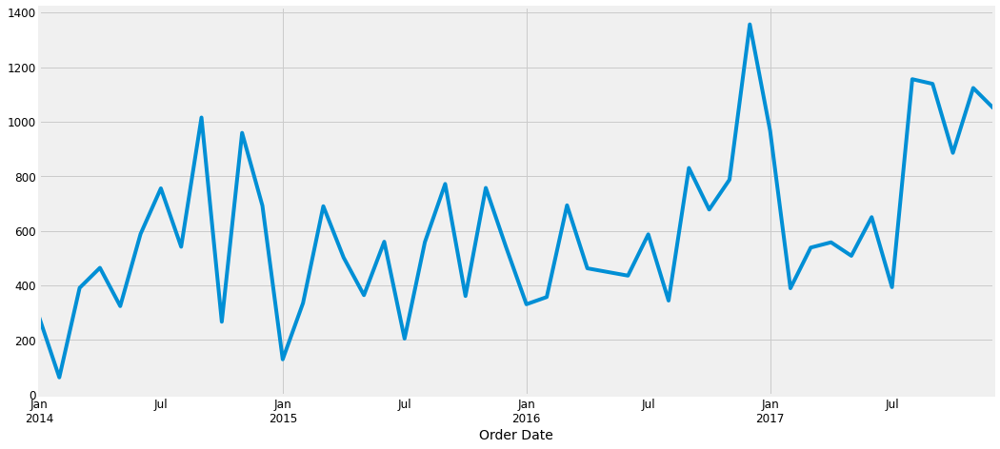

In [107]:
# Visualizing the Sales Time Series Data
monthly.plot(figsize = (16, 7))
plt.show()

- There are some different patterns appered in the above plot, also we can identify that sales are "LOW" ate the biginning of the year and " HIGH" at the end of the year.We can also identify that sales are decreased in the middle of the year for couple of months.Analysing this data by using three components: trend, seasonability & noice.

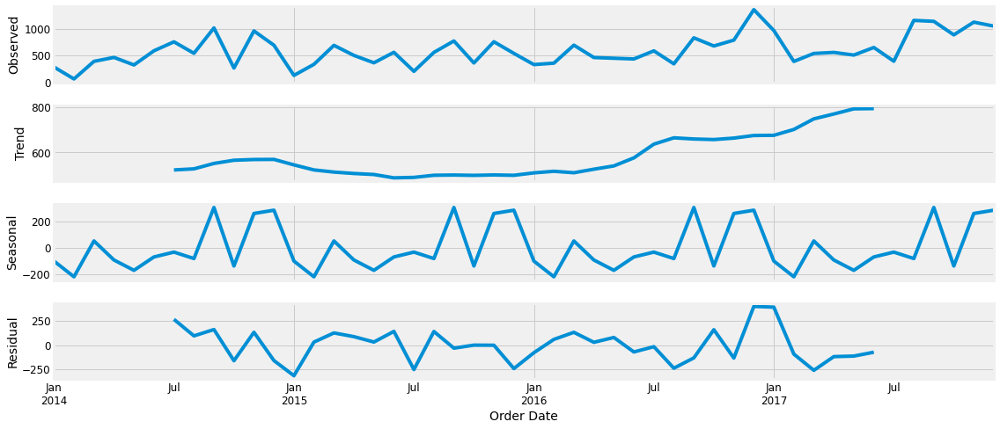

In [108]:
from pylab import rcParams
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(monthly, model = 'additive')
fig = decomposition.plot()
plt.show()

- From the above plot, trend is gradually increased thought the given timelines (4 years). Seasonal data is similar to the raw data.

- Using ARIMA to perform the forecating analysis
- ARIMA stands for - Autoregressive Integrated Moving Average.
- This method is commonly used for time sesries prediction.
- We can use the above three parameters Seasonability, trend & noice can be shown in ARIMA model as ARIMA(p,d,q)

In [109]:
p = d = q = range(0,2)
pdq = list(itertools.product(p,d,q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p,d,q))]

print('Parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


Parameter selection for "Office Supplies Sales" using ARIMA time series model. Using "Grid Search" to find the optimal set of parameters the fits the best performance of our data model.

In [110]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(monthly, order = param,
                                           seasonal_order = param_seasonal,
                                           enforce_stationarity = False,
                                           enforce_invertibility = False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:747.1990404227043
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:1464.4967660059162
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:500.7335398750499
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:516.0876543936834
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1459.9493195280877
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:347.44488563489716
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:702.6891395292475
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:nan
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:487.76014158147206
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:517.4952646585557
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:3022.312250877466
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:345.69220944601045
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:666.4572045007284
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:1360.057691075371
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:503.0840747609876
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:500.0109385290892
ARIMA(0, 1, 0)x(1, 0, 1, 12)12 - AIC:1483.149298292236
ARIMA(0, 1, 0)x(1, 1, 0, 12)12 - AIC:335.7148959418817
ARIMA(0, 1, 1)x(0, 

Fitting the ARIMA Model using the optimal parameters.

In [111]:
mod = sm.tsa.statespace.SARIMAX(monthly, order = (1,1,1),
                               seasonal_order = (1,1,0,12),
                               enforce_stationarity = False,
                               enforce_invertibility = False)

results = mod.fit()
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2479      0.328      0.755      0.450      -0.395       0.891
ma.L1         -0.9389      0.462     -2.030      0.042      -1.845      -0.032
ar.S.L12      -0.6135      0.348     -1.762      0.078      -1.296       0.069
sigma2      7.421e+04   2.68e+04      2.768      0.006    2.17e+04    1.27e+05


Findingout the abnormal behavious of the data

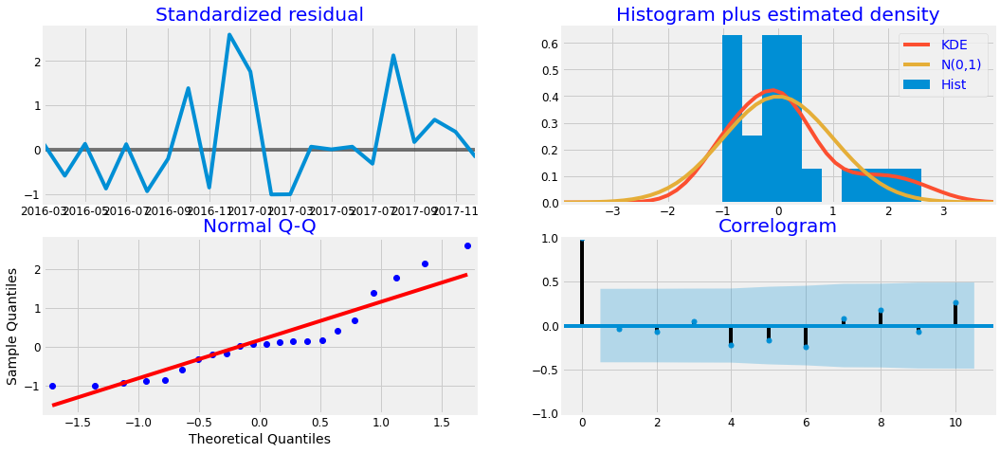

In [112]:
results.plot_diagnostics(figsize = (16,7))
plt.show()

From the above plots we can say that out dats is normally distributed.

<p>Verifying the forecasts.
<p>we can compare predicted values and real values of sales data.

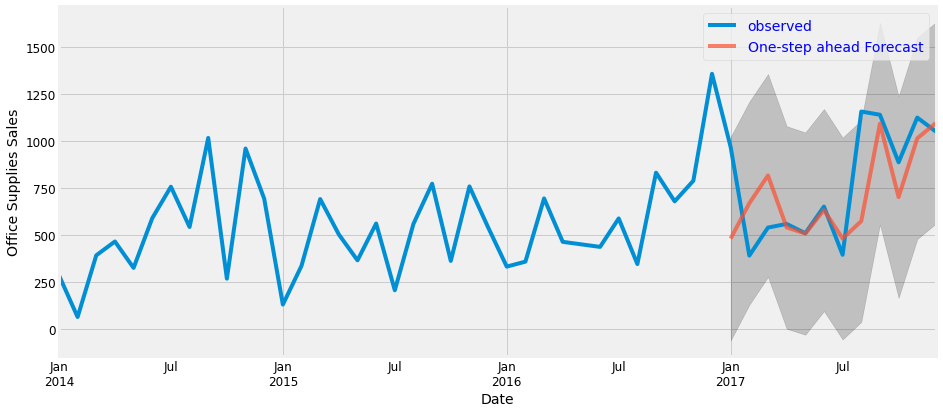

In [113]:
pred = results.get_prediction(start = pd.to_datetime('2017-01-01'), dynamic = False)
pred_ci = pred.conf_int()

ax = monthly['2014':].plot(label = 'observed')
pred.predicted_mean.plot(ax = ax, label = 'One-step ahead Forecast', alpha = .7, figsize = (14, 6))

ax.fill_between(pred_ci.index, 
                pred_ci.iloc[:,0],
                pred_ci.iloc[:,1],
               color = 'k',
               alpha = .2)

ax.set_xlabel('Date')
ax.set_ylabel('Office Supplies Sales')
plt.legend()
plt.show()

So, from the above figure,
- we can say that predicted values are aligned with the rela values in the data for Sales information.
- gray area shows us the confidential interval.

In [114]:
monthly_forecasted = pred.predicted_mean
monthly_truth = monthly['2017-01-01':]

mse = ((monthly_forecasted -monthly_truth)**2).mean()

print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

The Mean Squared Error of our forecasts is 65844.6


In [115]:
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))


The Root Mean Squared Error of our forecasts is 256.6


- The Root Mean Squared Error (RMSE)  256.6 - "Average Office Supplies Sales Data".
- From data, Office Supplies Sales ranges from 50 to 1350.
- RMSE value is in between the actual range values.i.e., 50 & 1350.

Representing the forecasts of the data.

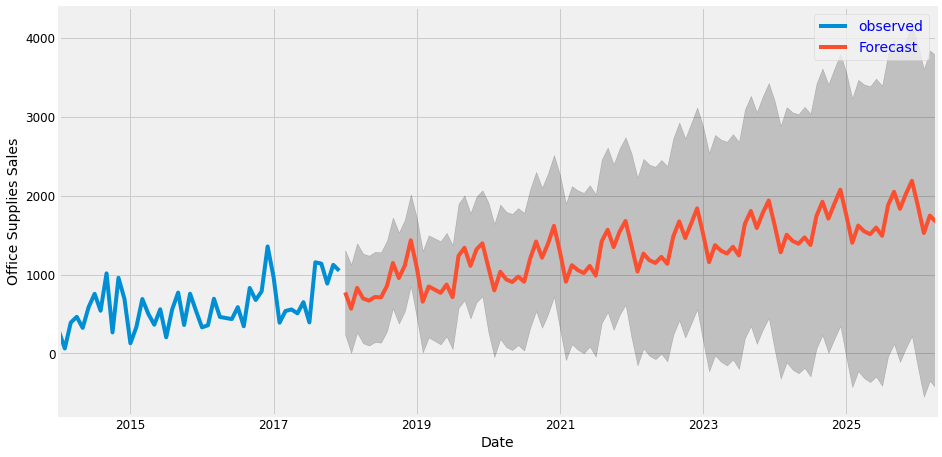

In [116]:
pred_uc = results.get_forecast(steps = 100)
pred_ci = pred_uc.conf_int()

ax = monthly.plot(label = 'observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax = ax, label ='Forecast')
ax.fill_between(pred_ci.index,
               pred_ci.iloc[:,0],
               pred_ci.iloc[:,1],
               color = 'k',
               alpha = .2)

ax.set_xlabel('Date')
ax.set_ylabel('Office Supplies Sales')
plt.legend()
plt.show()

so, here the ARIMA model clearly indicates the Office Supplies Sales data Seasonality. we compare the time series of Office Supplies & Furniture to analyse the forecating values.

Extracting the data for time series of office supplies and furniture

In [117]:
furniture = df.loc[df['Category'] == 'Furniture']
furniture = furniture[['Order Date', 'Sales']]
furniture = furniture.sort_values('Order Date')
furniture = furniture.groupby('Order Date')['Sales'].sum().reset_index()
furniture = furniture.set_index('Order Date')

In [118]:
monthly_office = monthly
monthly_furniture = furniture['Sales'].resample('MS').mean()

In [119]:
furniture = pd.DataFrame({'Order Date':monthly_furniture.index, 'Sales':monthly_furniture.values})
office = pd.DataFrame({'Order Date': monthly_office.index, 'Sales': monthly_office.values})

store = furniture.merge(office, how = 'inner', on = 'Order Date')
store.rename(columns = {'Sales_x': 'furniture_sales', 'Sales_y': 'office_sales'}, inplace=True)
store.head()

,Order Date,furniture_sales,office_sales
0,2014-01-01,480.194231,285.357647
1,2014-02-01,367.931600,63.042588
2,2014-03-01,857.291529,391.176318
3,2014-04-01,567.488357,464.794750
4,2014-05-01,432.049188,324.346545


Representing the Sales Data

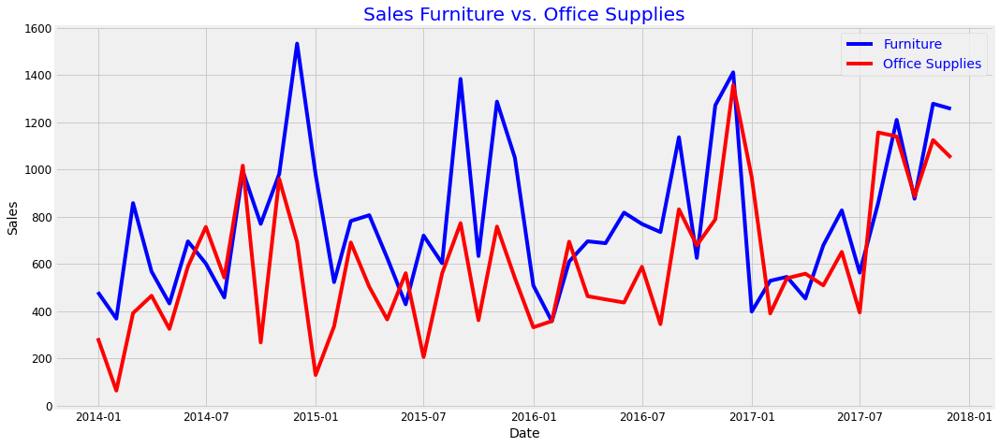

In [120]:
plt.figure(figsize = (16, 7))
plt.plot(store['Order Date'], store['furniture_sales'], 'b-', label = 'Furniture')
plt.plot(store['Order Date'], store['office_sales'], 'r-', label = 'Office Supplies')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Furniture vs. Office Supplies')
plt.legend()
plt.show()

From the above graph, we can clearly say 
- That sales of office supplies & furniture having a similar seasonal trending.
- Average the daily sales of office supplies is less than the average daily sales for furniture in most of the months.
- Here we can derive that the value of furniture should be much higher than those of office supplies.
- However, sometimes, office supplies passed furniture on average daily sales.we will identify the timestamp when was the 1st time office supplies’ sales exceeded those of furniture’s.

In [121]:
first_date = store.loc[np.min(list(np.where(store['office_sales'] > store['furniture_sales'])[0])), 'Order Date']
print("Office supplies first time produced higher sales than furniture is {}.".format(first_date.date()))

Office supplies first time produced higher sales than furniture is 2014-07-01.


Forecasting analysis of time series modeling with Prophet

- Prophet model is used to analyze the time-series patterns on yearly, weekly and daily sales data.

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<Figure size 1152x504 with 0 Axes>

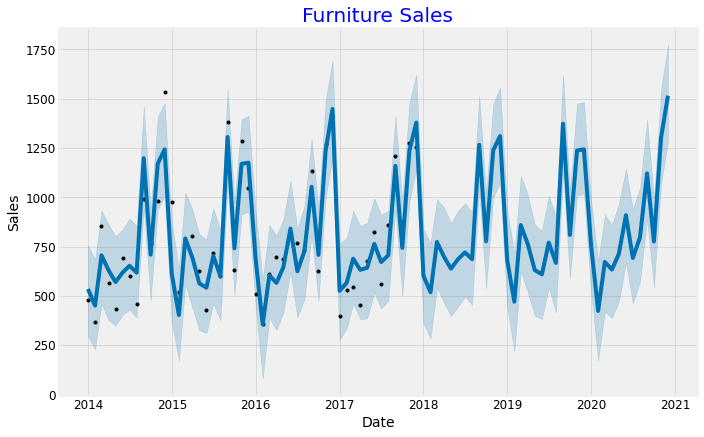

In [122]:
from fbprophet import Prophet
furniture = furniture.rename(columns={'Order Date': 'ds', 'Sales': 'y'})
furniture_model = Prophet(interval_width = 0.95)
furniture_model.fit(furniture)

office = office.rename(columns={'Order Date': 'ds', 'Sales': 'y'})
office_model = Prophet(interval_width=0.95)
office_model.fit(office)

furniture_forecast = furniture_model.make_future_dataframe(periods = 36, freq = 'MS')
furniture_forecast = furniture_model.predict(furniture_forecast)

office_forecast = office_model.make_future_dataframe(periods = 36, freq = 'MS')
office_forecast = office_model.predict(office_forecast)

plt.figure(figsize = (16,7))
furniture_model.plot(furniture_forecast, xlabel = 'Date', ylabel = 'Sales')
plt.title('Furniture Sales')
plt.show()

<Figure size 1152x504 with 0 Axes>

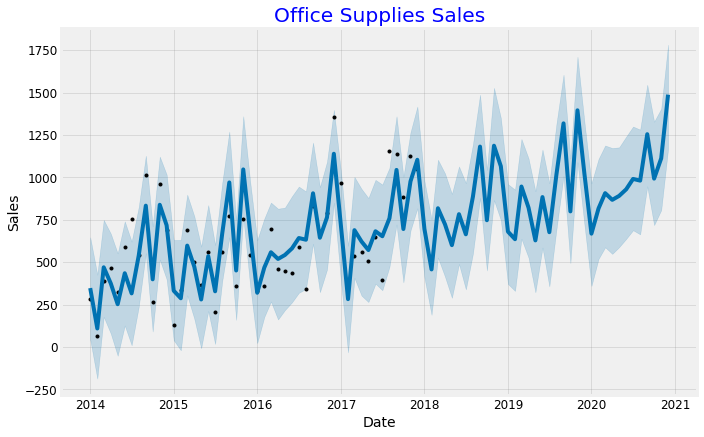

In [123]:
plt.figure(figsize = (16,7))
office_model.plot(office_forecast, xlabel = 'Date', ylabel = 'Sales')

plt.title('Office Supplies Sales')
plt.show()

Comparing the 2 forecasts "Furniture sales" & "Office Supplies Sales"
<p>Here, We already have the forecasts for 3 years for these two categories 1. Furniture & 2. Office Supplies Sales into the future. Joining them together to compare their future forecasts.

In [124]:
furniture_names = ['furniture_%s' % column for column in furniture_forecast.columns]
office_names = ['office_%s' % column for column in office_forecast.columns]

merge_furniture_forecast = furniture_forecast.copy()
merge_office_forecast = office_forecast.copy()

merge_furniture_forecast.columns = furniture_names
merge_office_forecast.columns = office_names

forecast = pd.merge(merge_furniture_forecast, merge_office_forecast,
                   how = 'inner', left_on = 'furniture_ds',
                   right_on = 'office_ds')

forecast = forecast.rename(columns = {'furniture_ds': 'Date'}).drop('office_ds', axis = 1)

forecast.head()

,Date,furniture_trend,furniture_yhat_lower,furniture_yhat_upper,furniture_trend_lower,furniture_trend_upper,furniture_additive_terms,furniture_additive_terms_lower,furniture_additive_terms_upper,furniture_yearly,...,office_additive_terms,office_additive_terms_lower,office_additive_terms_upper,office_yearly,office_yearly_lower,office_yearly_upper,office_multiplicative_terms,office_multiplicative_terms_lower,office_multiplicative_terms_upper,office_yhat
0,2014-01-01,726.057713,295.685393,759.510984,726.057713,726.057713,-190.685662,-190.685662,-190.685662,-190.685662,...,-140.040481,-140.040481,-140.040481,-140.040481,-140.040481,-140.040481,0.0,0.0,0.0,347.490278
1,2014-02-01,727.494023,229.676984,684.532963,727.494023,727.494023,-276.377703,-276.377703,-276.377703,-276.377703,...,-385.678283,-385.678283,-385.678283,-385.678283,-385.678283,-385.678283,0.0,0.0,0.0,109.240162
2,2014-03-01,728.791335,459.560667,934.524904,728.791335,728.791335,-22.389755,-22.389755,-22.389755,-22.389755,...,-31.379844,-31.379844,-31.379844,-31.379844,-31.379844,-31.379844,0.0,0.0,0.0,470.211349
3,2014-04-01,730.227645,378.334034,862.794992,730.227645,730.227645,-100.141158,-100.141158,-100.141158,-100.141158,...,-134.291690,-134.291690,-134.291690,-134.291690,-134.291690,-134.291690,0.0,0.0,0.0,374.687188
4,2014-05-01,731.617622,348.389071,803.418194,731.617622,731.617622,-160.815662,-160.815662,-160.815662,-160.815662,...,-263.821569,-263.821569,-263.821569,-263.821569,-263.821569,-263.821569,0.0,0.0,0.0,252.306682


Displaying the Furniture & Office Supplies trend.

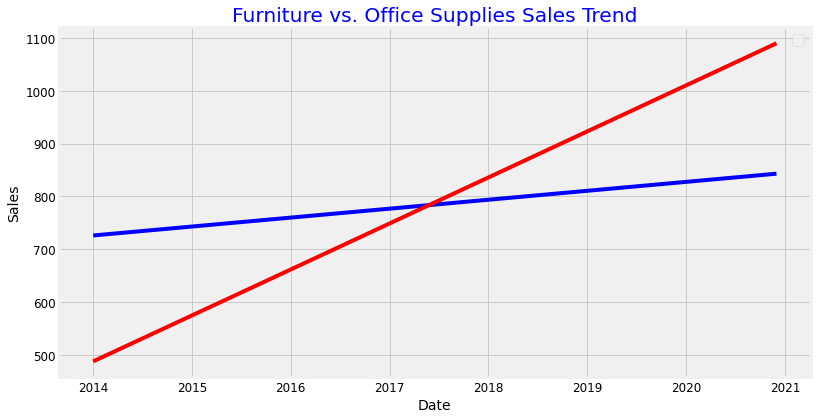

In [125]:
plt.figure(figsize = (12, 6))
plt.plot(forecast['Date'], forecast['furniture_trend'],'b-')
plt.plot(forecast['Date'], forecast['office_trend'], 'r-')
plt.legend(); plt.xlabel('Date'); plt.ylabel('Sales')
plt.title('Furniture vs. Office Supplies Sales Trend');
plt.show()

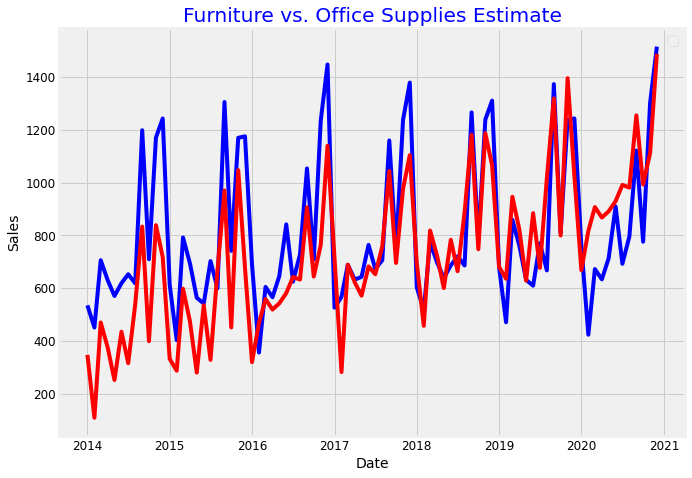

In [126]:
plt.figure(figsize=(10, 7))
plt.plot(forecast['Date'], forecast['furniture_yhat'], 'b-')
plt.plot(forecast['Date'], forecast['office_yhat'], 'r-')
plt.legend(); plt.xlabel('Date'); plt.ylabel('Sales')
plt.title('Furniture vs. Office Supplies Estimate');

Visulalizing the trends and patterns for furniture & Office Supplies sales data.

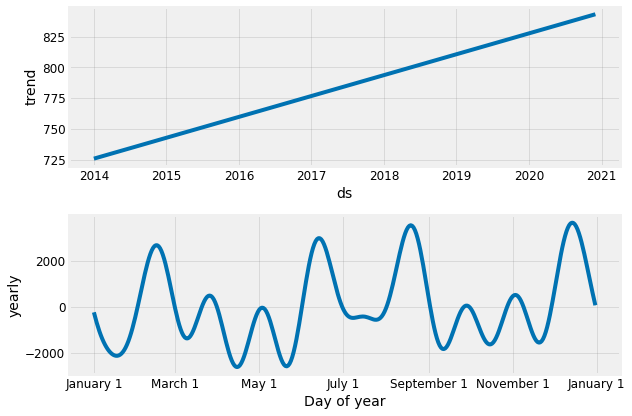

In [127]:
furniture_model.plot_components(furniture_forecast)
plt.show()

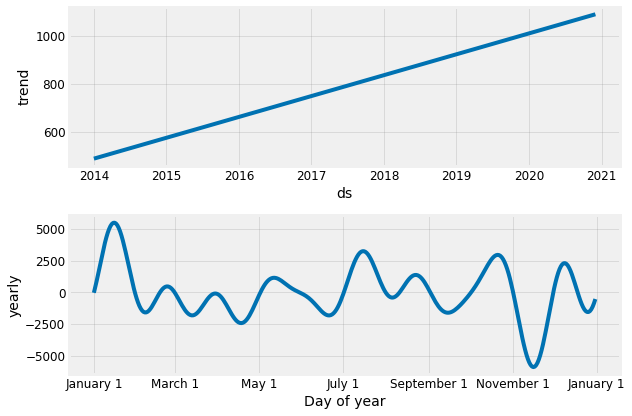

In [128]:
office_model.plot_components(office_forecast)
plt.show()

Conclusion: From the above analysis, we can say that Furniture & Office Supplies Sales both are linearly increasing over the time and will keep increasing the trend.
However, Office Supplies growth is slightly higher.